# IMPORT LIBRARY AND UNZIP DATASET

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip "/content/drive/MyDrive/dora_dataset/dataset_patches_filtered/10 species/VNUF-24082024-154.zip" #VNUF-3A
!unzip "/content/drive/MyDrive/dora_dataset/dataset_patches_filtered/10 species/VNUF-24082024-299.zip" #VNUF-3B
!unzip "/content/drive/MyDrive/dora_dataset/dataset_patches_filtered/10 species/VNUF-10082024-234.zip" #VNUF-2
!unzip "/content/drive/MyDrive/dora_dataset/dataset_patches_filtered/10 species/VNUF-22052024-134.zip" #VNUF-1

Streaming output truncated to the last 5000 lines.
  inflating: VNUF-24082024-299/train/Cinnamomum parthenoxylon/348_patch67.png  
  inflating: VNUF-24082024-299/train/Cinnamomum parthenoxylon/348_patch68.png  
  inflating: VNUF-24082024-299/train/Cinnamomum parthenoxylon/348_patch69.png  
  inflating: VNUF-24082024-299/train/Cinnamomum parthenoxylon/348_patch7.png  
  inflating: VNUF-24082024-299/train/Cinnamomum parthenoxylon/348_patch70.png  
  inflating: VNUF-24082024-299/train/Cinnamomum parthenoxylon/348_patch71.png  
  inflating: VNUF-24082024-299/train/Cinnamomum parthenoxylon/348_patch72.png  
  inflating: VNUF-24082024-299/train/Cinnamomum parthenoxylon/348_patch73.png  
  inflating: VNUF-24082024-299/train/Cinnamomum parthenoxylon/348_patch74.png  
  inflating: VNUF-24082024-299/train/Cinnamomum parthenoxylon/348_patch75.png  
  inflating: VNUF-24082024-299/train/Cinnamomum parthenoxylon/348_patch76.png  
  inflating: VNUF-24082024-299/train/Cinnamomum parthenoxylon/348_patc

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import numpy as np
import torch.nn.functional as F
import timm
from tqdm import tqdm

In [ ]:
import os
import shutil

# Define base paths for the source dataset
SOURCE_BASE_DIR = "/content/VNUF-22052024-134"
SOURCE_TRAIN_DIR = os.path.join(SOURCE_BASE_DIR, "train")
SOURCE_VAL_DIR = os.path.join(SOURCE_BASE_DIR, "val")
SOURCE_TEST_DIR = os.path.join(SOURCE_BASE_DIR, "test")

# Define the destination path for the mixed dataset
DEST_MIX_DIR = "/content/VNUF-22052024-134-mix"

print(f"Source dataset base directory: {SOURCE_BASE_DIR}")
print(f"Destination mixed directory: {DEST_MIX_DIR}")

Source dataset base directory: /content/VNUF-22052024-134
Destination mixed directory: /content/VNUF-22052024-134-mix


In [ ]:
# Create the destination mixed directory if it doesn't exist
os.makedirs(DEST_MIX_DIR, exist_ok=True)
print(f"Created or ensured existence of: {DEST_MIX_DIR}")

# List of source directories to combine
source_dirs = [SOURCE_TRAIN_DIR, SOURCE_VAL_DIR, SOURCE_TEST_DIR]

# Iterate through each source directory (train, val, test)
for src_root_dir in source_dirs:
    if not os.path.exists(src_root_dir):
        print(f"Warning: Source directory not found: {src_root_dir}. Skipping.")
        continue

    print(f"\nProcessing images from: {src_root_dir}")
    # Iterate through each class subfolder in the current source directory
    for class_name in os.listdir(src_root_dir):
        src_class_dir = os.path.join(src_root_dir, class_name)
        dest_class_dir = os.path.join(DEST_MIX_DIR, class_name)

        # Create the corresponding class subfolder in the destination mixed directory
        os.makedirs(dest_class_dir, exist_ok=True)

        # Copy all image files from the source class directory to the destination class directory
        for filename in os.listdir(src_class_dir):
            if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.gif')):
                src_file_path = os.path.join(src_class_dir, filename)
                dest_file_path = os.path.join(dest_class_dir, filename)

                # Handle potential duplicate filenames by appending a suffix
                counter = 1
                original_filename_no_ext, ext = os.path.splitext(filename)
                while os.path.exists(dest_file_path):
                    dest_file_path = os.path.join(dest_class_dir, f"{original_filename_no_ext}_{counter}{ext}")
                    counter += 1

                shutil.copy(src_file_path, dest_file_path)

        print(f"  Copied images for class '{class_name}' to {dest_class_dir}")

print("\n✨ Data mixing complete. All images are now in the VNUF-24082024-299-mix folder.")

Created or ensured existence of: /content/VNUF-22052024-134-mix

Processing images from: /content/VNUF-22052024-134/train
  Copied images for class 'Alstonia scholaris' to /content/VNUF-22052024-134-mix/Alstonia scholaris
  Copied images for class 'Lagerstroemia speciosa' to /content/VNUF-22052024-134-mix/Lagerstroemia speciosa
  Copied images for class 'Pinus massoniana' to /content/VNUF-22052024-134-mix/Pinus massoniana
  Copied images for class 'Cinnamomum parthenoxylon' to /content/VNUF-22052024-134-mix/Cinnamomum parthenoxylon
  Copied images for class 'Delonix regia' to /content/VNUF-22052024-134-mix/Delonix regia
  Copied images for class 'Ficus benghalensis' to /content/VNUF-22052024-134-mix/Ficus benghalensis
  Copied images for class 'Chukrasia tabularis' to /content/VNUF-22052024-134-mix/Chukrasia tabularis
  Copied images for class 'Acacia auriculiformis' to /content/VNUF-22052024-134-mix/Acacia auriculiformis
  Copied images for class 'Aphanamixis grandifolia' to /content/

In [ ]:
import os
import shutil

# Define base paths for the source dataset
SOURCE_BASE_DIR = "/content/VNUF-24082024-299"
SOURCE_TRAIN_DIR = os.path.join(SOURCE_BASE_DIR, "train")
SOURCE_VAL_DIR = os.path.join(SOURCE_BASE_DIR, "val")
SOURCE_TEST_DIR = os.path.join(SOURCE_BASE_DIR, "test")

# Define the destination path for the mixed dataset
DEST_MIX_DIR = "/content/VNUF-24082024-299-mix"

print(f"Source dataset base directory: {SOURCE_BASE_DIR}")
print(f"Destination mixed directory: {DEST_MIX_DIR}")

Source dataset base directory: /content/VNUF-24082024-299
Destination mixed directory: /content/VNUF-24082024-299-mix


In [ ]:
# Create the destination mixed directory if it doesn't exist
os.makedirs(DEST_MIX_DIR, exist_ok=True)
print(f"Created or ensured existence of: {DEST_MIX_DIR}")

# List of source directories to combine
source_dirs = [SOURCE_TRAIN_DIR, SOURCE_VAL_DIR, SOURCE_TEST_DIR]

# Iterate through each source directory (train, val, test)
for src_root_dir in source_dirs:
    if not os.path.exists(src_root_dir):
        print(f"Warning: Source directory not found: {src_root_dir}. Skipping.")
        continue

    print(f"\nProcessing images from: {src_root_dir}")
    # Iterate through each class subfolder in the current source directory
    for class_name in os.listdir(src_root_dir):
        src_class_dir = os.path.join(src_root_dir, class_name)
        dest_class_dir = os.path.join(DEST_MIX_DIR, class_name)

        # Create the corresponding class subfolder in the destination mixed directory
        os.makedirs(dest_class_dir, exist_ok=True)

        # Copy all image files from the source class directory to the destination class directory
        for filename in os.listdir(src_class_dir):
            if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.gif')):
                src_file_path = os.path.join(src_class_dir, filename)
                dest_file_path = os.path.join(dest_class_dir, filename)

                # Handle potential duplicate filenames by appending a suffix
                counter = 1
                original_filename_no_ext, ext = os.path.splitext(filename)
                while os.path.exists(dest_file_path):
                    dest_file_path = os.path.join(dest_class_dir, f"{original_filename_no_ext}_{counter}{ext}")
                    counter += 1

                shutil.copy(src_file_path, dest_file_path)

        print(f"  Copied images for class '{class_name}' to {dest_class_dir}")

print("\n✨ Data mixing complete. All images are now in the VNUF-24082024-299-mix folder.")

Created or ensured existence of: /content/VNUF-24082024-299-mix

Processing images from: /content/VNUF-24082024-299/train
  Copied images for class 'Alstonia scholaris' to /content/VNUF-24082024-299-mix/Alstonia scholaris
  Copied images for class 'Lagerstroemia speciosa' to /content/VNUF-24082024-299-mix/Lagerstroemia speciosa
  Copied images for class 'Pinus massoniana' to /content/VNUF-24082024-299-mix/Pinus massoniana
  Copied images for class 'Cinnamomum parthenoxylon' to /content/VNUF-24082024-299-mix/Cinnamomum parthenoxylon
  Copied images for class 'Delonix regia' to /content/VNUF-24082024-299-mix/Delonix regia
  Copied images for class 'Ficus benghalensis' to /content/VNUF-24082024-299-mix/Ficus benghalensis
  Copied images for class 'Chukrasia tabularis' to /content/VNUF-24082024-299-mix/Chukrasia tabularis
  Copied images for class 'Acacia auriculiformis' to /content/VNUF-24082024-299-mix/Acacia auriculiformis
  Copied images for class 'Aphanamixis grandifolia' to /content/

# Loss Functions

In [ ]:
#CORAL Domain Adaptation
class CORALDomainAdaptationLoss(nn.Module):
    def __init__(self, reduction: str = "mean"):
        super().__init__()
        assert reduction in ("mean", "sum")
        self.reduction = reduction

    @staticmethod
    def _covariance(features: torch.Tensor) -> torch.Tensor:
        n = features.size(0)
        if n <= 1:
            d = features.size(1)
            return torch.zeros(d, d, device=features.device, dtype=features.dtype)
        features = features.float()
        centered = features - features.mean(dim=0, keepdim=True)
        return (centered.T @ centered) / (n - 1)

    def forward(self, source: torch.Tensor, target: torch.Tensor) -> torch.Tensor:
        d = source.size(1)
        cov_s = self._covariance(source)
        cov_t = self._covariance(target)
        diff = cov_s - cov_t
        loss = (diff * diff).sum()
        if self.reduction == "mean":
            loss = loss / (4.0 * d * d)
        return loss

#Triplet
class TripletLoss(nn.Module):
    def __init__(self, margin: float = 1.0):
        super().__init__()
        self.margin = margin

    def forward(self, features: torch.Tensor, labels: torch.Tensor) -> torch.Tensor:
        if features.numel() == 0 or labels.numel() == 0:
            return torch.zeros(1, device=features.device)

        dot_product = features @ features.T
        square_norm = torch.diag(dot_product)
        dist_matrix = square_norm.unsqueeze(0) - 2 * dot_product + square_norm.unsqueeze(1)
        dist_matrix = torch.sqrt(torch.relu(dist_matrix))

        loss = 0.0
        n = features.size(0)

        for i in range(n):
            anchor_label = labels[i]
            positive_mask = (labels == anchor_label) & (torch.arange(n, device=labels.device) != i)
            negative_mask = (labels != anchor_label)
            if not positive_mask.any() or not negative_mask.any():
                continue
            hard_positive_dist = dist_matrix[i, positive_mask].max()
            hard_negative_dist = dist_matrix[i, negative_mask].min()
            loss += F.relu(hard_positive_dist - hard_negative_dist + self.margin)

        if n > 0:
            return loss / n
        else:
            return torch.zeros(1, device=features.device)

#Center
class CenterLoss(nn.Module):
    def __init__(self, num_classes: int, feat_dim: int, device: torch.device):
        super().__init__()
        self.num_classes = num_classes
        self.feat_dim = feat_dim
        self.device = device
        self.centers = nn.Parameter(torch.randn(num_classes, feat_dim).to(device), requires_grad=False)

    def forward(self, features: torch.Tensor, labels: torch.Tensor) -> torch.Tensor:
        if features.numel() == 0 or labels.numel() == 0:
            return torch.zeros(1, device=features.device)

        batch_size = features.size(0)
        batch_centers = self.centers.index_select(0, labels)
        loss = torch.sum(torch.pow(features - batch_centers, 2)) / 2.0
        return loss / batch_size

    def update_centers(self, features: torch.Tensor, labels: torch.Tensor, alpha: float):
        for i in range(self.num_classes):
            mask = (labels == i)
            if mask.any():
                self.centers.data[i] -= alpha * (self.centers.data[i] - features[mask].mean(dim=0))

#Focal
class FocalLoss(nn.Module):
    def __init__(self, alpha=1, gamma=2, reduction='mean', num_classes=None):
        super(FocalLoss, self).__init__()
        self.gamma = gamma
        self.reduction = reduction

        if isinstance(alpha, (list, np.ndarray)):
            self.alpha = torch.tensor(alpha, dtype=torch.float)
            if num_classes is not None and len(self.alpha) != num_classes:
                raise ValueError(f"Length of alpha tensor ({len(self.alpha)}) must match num_classes ({num_classes})")
        else:
            self.alpha = alpha

    def forward(self, inputs, targets):
        ce_loss = nn.CrossEntropyLoss(reduction='none')(inputs, targets)
        pt = torch.exp(-ce_loss)

        if isinstance(self.alpha, torch.Tensor):
            if self.alpha.device != inputs.device:
                self.alpha = self.alpha.to(inputs.device)
            alpha_factor = self.alpha.gather(0, targets.view(-1))
        else:
            alpha_factor = self.alpha

        focal_loss = alpha_factor * (1 - pt) ** self.gamma * ce_loss

        if self.reduction == 'mean':
            return focal_loss.mean()
        elif self.reduction == 'sum':
            return focal_loss.sum()
        else:
            return focal_loss

# GeoIdTree model

In [ ]:
class GeoIdTreeModel(nn.Module):
    def __init__(self, num_classes: int, pretrained: bool = True):
        super().__init__()
        self.base_model = timm.create_model('vit_base_patch16_dinov3', pretrained=pretrained, num_classes=0)
        model_output_features = self.base_model.num_features

        # small bottleneck to reduce dimension of CORAL
        self.bottleneck = nn.Sequential(
            nn.Linear(model_output_features, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(inplace=True),
        )
        self.classifier = nn.Linear(256, num_classes)

    def forward(self, x: torch.Tensor):
        pooled_features = self.base_model(x)  # (B, 1024)

        # If for some reason the output is not flat (e.g., (B, 1024, 1, 1)), flatten it
        if pooled_features.ndim > 2:
            pooled_features = pooled_features.flatten(1)

        feat     = self.bottleneck(pooled_features)      # (B, 256)  ← for CORAL
        logits   = self.classifier(feat)        # (B, C)
        return logits, feat

# PATHS AND CONFIGURATIONS

In [ ]:
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]
SOURCE_DIR = "/content/VNUF-24082024-154/train"   # labeled
TARGET_DIR = "/content/VNUF-10082024-234/train"   # unlabeled
VAL_DIR    = "/content/VNUF-24082024-154/val"

train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
])

val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
])

source_dataset = datasets.ImageFolder(SOURCE_DIR, transform=train_transform)
target_dataset = datasets.ImageFolder(TARGET_DIR, transform=train_transform)
val_dataset    = datasets.ImageFolder(VAL_DIR,    transform=val_transform)

NUM_CLASSES = len(source_dataset.classes)
print(f"Number of classes in dataset: {NUM_CLASSES} — {source_dataset.classes}")

source_loader = DataLoader(source_dataset, batch_size=32, shuffle=True,
                           num_workers=4, pin_memory=True, drop_last=True)
target_loader = DataLoader(target_dataset, batch_size=32, shuffle=True,
                           num_workers=4, pin_memory=True, drop_last=True)
val_loader    = DataLoader(val_dataset,    batch_size=32, shuffle=False,
                           num_workers=4, pin_memory=True)

Number of classes in dataset: 10 — ['Acacia auriculiformis', 'Alstonia scholaris', 'Aphanamixis grandifolia', 'Chukrasia tabularis', 'Cinnamomum parthenoxylon', 'Delonix regia', 'Dracontomelon dao', 'Ficus benghalensis', 'Lagerstroemia speciosa', 'Pinus massoniana']


In [ ]:
DEVICE      = torch.device("cuda" if torch.cuda.is_available() else "cpu")
EPOCHS      = 50
LR          = 5e-5
CORAL_LAMBDA = 0.1
TRIPLET_LAMBDA = 0.1
CENTER_LAMBDA = 0.1
CENTER_ALPHA = 0.5

# Focal Loss parameters
FOCAL_ALPHA = [0.1027876, 4.17574618, 0.19606212, 0.27538212, 0.16271173, 0.45096324, 0.26035827, 1.63262257, 2.60046469, 0.14290148]
FOCAL_GAMMA = 2      # Gamma parameter for Focal Loss

model      = GeoIdTreeModel(num_classes=NUM_CLASSES).to(DEVICE)
focal_loss = FocalLoss(alpha=FOCAL_ALPHA, gamma=FOCAL_GAMMA, num_classes=NUM_CLASSES).to(DEVICE)
cora_loss = CORALDomainAdaptationLoss(reduction="mean")
triplet_loss = TripletLoss(margin=1.0) # Triplet Loss init
center_loss = CenterLoss(num_classes=NUM_CLASSES, feat_dim=256, device=DEVICE)

optimizer  = optim.Adam(model.parameters(), lr=LR, weight_decay=1e-4)
scheduler  = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS)
scaler     = torch.cuda.amp.GradScaler()   # mixed precision


/tmp/ipykernel_15468/4151734936.py:21: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler     = torch.cuda.amp.GradScaler()   # mixed precision


# TRAIN MODEL

In [ ]:
TRAIN_PATH_CHECKPOINT = "/content/drive/MyDrive/cvbmc/model_chkpoint/2104/CORAL_TRIPLET_CENTER_VNUF154_10species_best_vit_base_patch16_dinov3.pth"

#train model function
def train_one_epoch(epoch: int) -> dict:
    model.train()
    target_iter = iter(target_loader)

    total_cls = total_coral = total_triplet = total_center = total_loss = correct = n = 0

    pbar = tqdm(source_loader, desc=f"Epoch {epoch}/{EPOCHS}")
    for src_imgs, src_labels in pbar:
        try:
            tgt_imgs, _ = next(target_iter)
        except StopIteration:
            target_iter  = iter(target_loader)
            tgt_imgs, _  = next(target_iter)

        src_imgs   = src_imgs.to(DEVICE)
        src_labels = src_labels.to(DEVICE)
        tgt_imgs   = tgt_imgs.to(DEVICE)

        optimizer.zero_grad()

        with torch.cuda.amp.autocast():
            src_logits, src_feat = model(src_imgs)
            loss_cls = focal_loss(src_logits, src_labels) # Use Focal Loss for classification

            _, tgt_feat = model(tgt_imgs)

            loss_coral = cora_loss(src_feat, tgt_feat)
            loss_triplet = triplet_loss(src_feat, src_labels)
            loss_center = center_loss(src_feat, src_labels)
            loss = loss_cls + CORAL_LAMBDA * loss_coral + TRIPLET_LAMBDA * loss_triplet + CENTER_LAMBDA * loss_center

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        center_loss.update_centers(src_feat.detach(), src_labels, CENTER_ALPHA)

        bs = src_imgs.size(0)
        total_cls   += loss_cls.item()   * bs
        total_coral += loss_coral.item() * bs
        total_triplet += loss_triplet.item() * bs
        total_center  += loss_center.item()  * bs
        total_loss  += loss.item()       * bs
        correct     += (src_logits.argmax(1) == src_labels).sum().item()
        n           += bs

        pbar.set_postfix({
            'L_cls': f'{loss_cls.item():.4f}',
            'L_coral': f'{loss_coral.item():.4f}',
            'L_triplet': f'{loss_triplet.item():.4f}',
            'L_center': f'{loss_center.item():.4f}',
            'L_total': f'{loss.item():.4f}',
            'Acc_src': f'{(correct/n)*100:.1f}%'
        })

    scheduler.step()
    return {
        "loss_cls":   total_cls   / n,
        "loss_coral": total_coral / n,
        "loss_triplet": total_triplet / n,
        "loss_center":  total_center  / n,
        "loss_total": total_loss  / n,
        "acc_src":    correct     / n,
    }

#eval
@torch.no_grad()
def evaluate(loader: DataLoader) -> dict:
    model.eval()
    correct = n = 0
    for imgs, labels in loader:
        imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
        logits, _ = model(imgs)
        correct += (logits.argmax(1) == labels).sum().item()
        n       += imgs.size(0)
    return {"acc": correct / n}

best_val_acc = 0.0


#run train
for epoch in range(1, EPOCHS + 1):
    train_stats = train_one_epoch(epoch)
    val_stats   = evaluate(val_loader)

    print(
        f"Epoch {epoch:3d}/{EPOCHS} | "
        f"L_cls={train_stats['loss_cls']:.4f}  "
        f"L_coral={train_stats['loss_coral']:.4f}  "
        f"L_triplet={train_stats['loss_triplet']:.4f}  " \
        f"L_center={train_stats['loss_center']:.4f}  " \
        f"L_total={train_stats['loss_total']:.4f} | "
        f"Acc_src={train_stats['acc_src']*100:.1f}%  "
        f"Acc_val={val_stats['acc']*100:.1f}%"
    )

    # best checkpoint by val_acc
    if val_stats["acc"] > best_val_acc:
        best_val_acc = val_stats["acc"]
        torch.save({
            "epoch":      epoch,
            "model":      model.state_dict(),
            "optimizer":  optimizer.state_dict(),
            "val_acc":    best_val_acc,
        }, TRAIN_PATH_CHECKPOINT)
        print(f"Saved best model with val_acc={best_val_acc*100:.1f}%")

print(f"\nBest val acc: {best_val_acc*100:.2f}%")

# Đánh giá cuối cùng trên tập kiểm tra
Sau khi quá trình huấn luyện hoàn tất, chúng ta sẽ tải mô hình tốt nhất đã lưu và đánh giá hiệu suất của nó trên tập dữ liệu kiểm tra riêng biệt.

Số mẫu test: 505

─────────────────────────────────────────
8. FINAL EVALUATION ON TEST SET
─────────────────────────────────────────
Loaded best model from epoch 9 with val_acc=86.31%
Top-1 Accuracy: 56.24%
Top-3 Accuracy: 77.82%
Top-5 Accuracy: 88.51%

─────────────────────────────────────────
Confusion Matrix
─────────────────────────────────────────
[[144   0   7   0   1   3   4   0   0  11]
 [  2   0   1   0   0   0   0   0   1   0]
 [  0   0  62   0   2   0   1   0   0   0]
 [  0   0   2   4   9   0   7   0   0   1]
 [ 20   0  21   0  20   0   7   0   0   7]
 [  5   0   4  15   4  32   0   0   0  28]
 [ 21   0  18   0   4   0   0   0   0   0]
 [  2   0   0   0   4   0   1   0   0   0]
 [  0   0   0   3   0   0   0   0   4   0]
 [  2   0   0   0   2   0   1   0   0  18]]


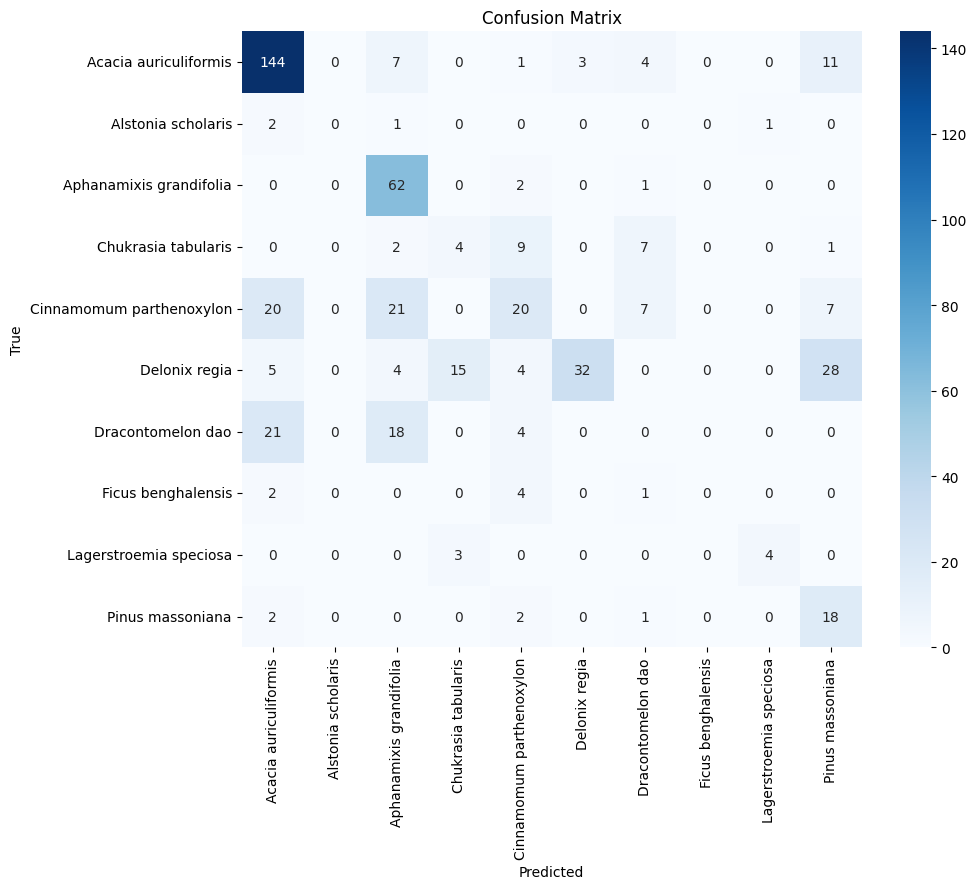


─────────────────────────────────────────
Classification Report
─────────────────────────────────────────
                          precision    recall  f1-score   support

   Acacia auriculiformis     0.7347    0.8471    0.7869       170
      Alstonia scholaris     0.0000    0.0000    0.0000         4
 Aphanamixis grandifolia     0.5391    0.9538    0.6889        65
     Chukrasia tabularis     0.1818    0.1739    0.1778        23
Cinnamomum parthenoxylon     0.4348    0.2667    0.3306        75
           Delonix regia     0.9143    0.3636    0.5203        88
       Dracontomelon dao     0.0000    0.0000    0.0000        43
      Ficus benghalensis     0.0000    0.0000    0.0000         7
  Lagerstroemia speciosa     0.8000    0.5714    0.6667         7
        Pinus massoniana     0.2769    0.7826    0.4091        23

                accuracy                         0.5624       505
               macro avg     0.3882    0.3959    0.3580       505
            weighted avg     0.57

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
TEST_DIR   = "/content/VNUF-22052024-134-mix" # Dedicated test set
test_dataset   = datasets.ImageFolder(TEST_DIR,   transform=val_transform)
test_loader   = DataLoader(test_dataset,   batch_size=32, shuffle=False,
                           num_workers=4, pin_memory=True)
print(f"Số mẫu test: {len(test_dataset)}")
# ─────────────────────────────────────────
# 8. FINAL EVALUATION ON TEST SET
# ─────────────────────────────────────────
print("\n─────────────────────────────────────────")
print("8. FINAL EVALUATION ON TEST SET")
print("─────────────────────────────────────────")

model_test = GeoIdTreeModel(num_classes=NUM_CLASSES).to(DEVICE)

# Load the best model
best_model_path = "/content/drive/MyDrive/cvbmc/model_chkpoint/1004/CORAL_TRIPLET_CENTER_VNUF154_best_vit_base_patch16_dinov3.pth"
checkpoint = torch.load(best_model_path, map_location=DEVICE)
model_test.load_state_dict(checkpoint["model"])
print(f"Loaded best model from epoch {checkpoint['epoch']} with val_acc={checkpoint['val_acc']*100:.2f}%")

# Evaluate on test set
import torch.nn.functional as F
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

@torch.no_grad()
def evaluate_and_predict(model_to_eval, loader: DataLoader):
    model_to_eval.eval()
    all_preds = []
    all_labels = []
    all_logits = []

    correct_top1 = 0
    correct_top3 = 0
    correct_top5 = 0
    n = 0

    for imgs, labels in loader:
        imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
        logits, _ = model_to_eval(imgs) # Unpack the tuple here

        # Top-1
        preds = logits.argmax(1)
        correct_top1 += (preds == labels).sum().item()

        # Top-3
        top3 = logits.topk(3, dim=1).indices  # shape: (batch_size, 5)
        correct_top3 += (top3 == labels.unsqueeze(1)).any(dim=1).sum().item()

        # Top-5
        top5 = logits.topk(5, dim=1).indices  # shape: (batch_size, 5)
        correct_top5 += (top5 == labels.unsqueeze(1)).any(dim=1).sum().item()

        n += imgs.size(0)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        all_logits.append(logits.cpu().numpy())

    return {
        "acc_top1": correct_top1 / n,
        "acc_top3": correct_top3 / n,
        "acc_top5": correct_top5 / n,
        "predictions": all_preds,
        "labels": all_labels,
        "logits": np.concatenate(all_logits)
    }

test_results = evaluate_and_predict(model_test, test_loader)
test_acc_top1 = test_results["acc_top1"]
test_acc_top3 = test_results["acc_top3"]
test_acc_top5 = test_results["acc_top5"]

print(f"Top-1 Accuracy: {test_acc_top1*100:.2f}%")
print(f"Top-3 Accuracy: {test_acc_top3*100:.2f}%")
print(f"Top-5 Accuracy: {test_acc_top5*100:.2f}%")

test_acc_top1 = test_results["acc_top1"]
test_acc_top3 = test_results["acc_top3"]
test_acc_top5 = test_results["acc_top5"]
all_preds = test_results["predictions"]
all_labels = test_results["labels"]
all_logits = test_results["logits"]

# Generate Confusion Matrix
print("\n─────────────────────────────────────────")
print("Confusion Matrix")
print("─────────────────────────────────────────")
cm = confusion_matrix(all_labels, all_preds)
print(cm)

# Visualize Confusion Matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=test_dataset.classes, yticklabels=test_dataset.classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Generate Classification Report
print("\n─────────────────────────────────────────")
print("Classification Report")
print("─────────────────────────────────────────")
report = classification_report(all_labels, all_preds, target_names=test_dataset.classes, digits=4)
print(report)


🚀 Bắt đầu quá trình dự đoán ảnh đơn lẻ, hiển thị ảnh và xác suất từng lớp...

Đang dự đoán ảnh trong thư mục: /content/VNUF-22052024-134-mix/Pinus massoniana
  Ảnh: 219_patch1.png -> Dự đoán: Pinus massoniana (Xác suất cao nhất: 0.96) ✅ Đúng


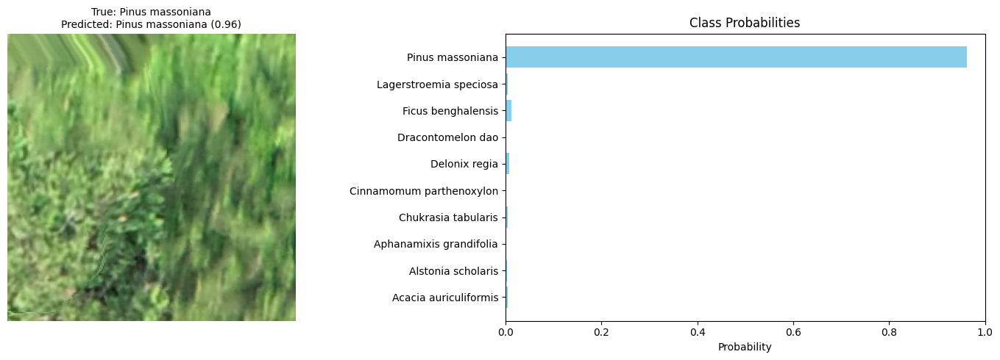

  Ảnh: 226_patch1.png -> Dự đoán: Pinus massoniana (Xác suất cao nhất: 0.31) ✅ Đúng


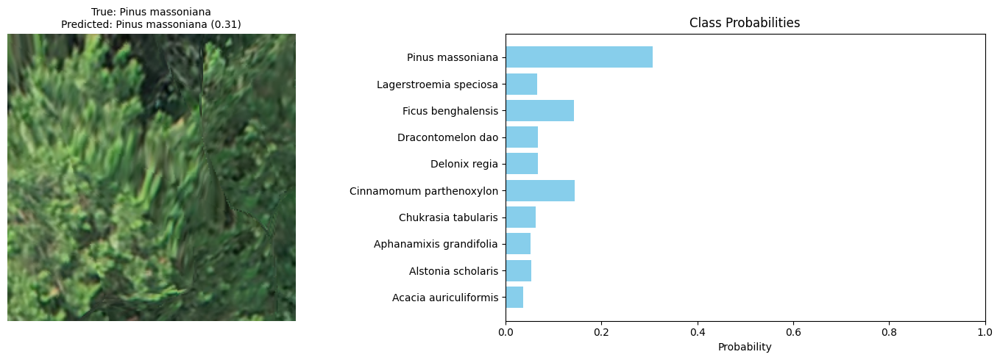

  Ảnh: 49_patch1.png -> Dự đoán: Acacia auriculiformis (Xác suất cao nhất: 0.90) ❌ Sai


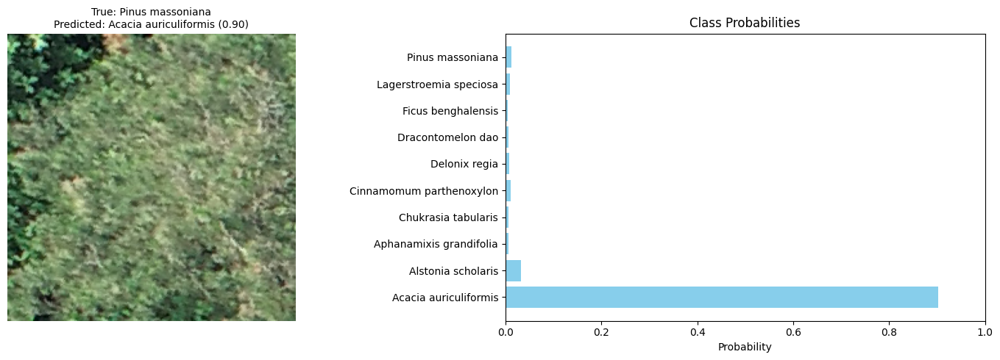

  Ảnh: 226_patch3.png -> Dự đoán: Pinus massoniana (Xác suất cao nhất: 0.81) ✅ Đúng


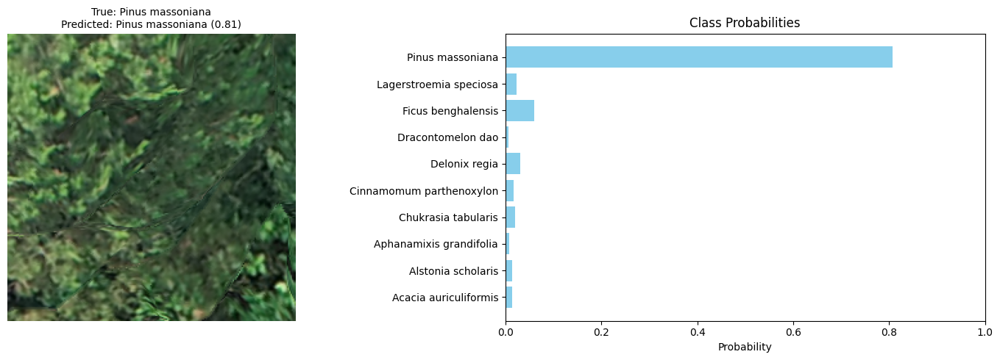

  Ảnh: 242_patch2.png -> Dự đoán: Pinus massoniana (Xác suất cao nhất: 0.96) ✅ Đúng


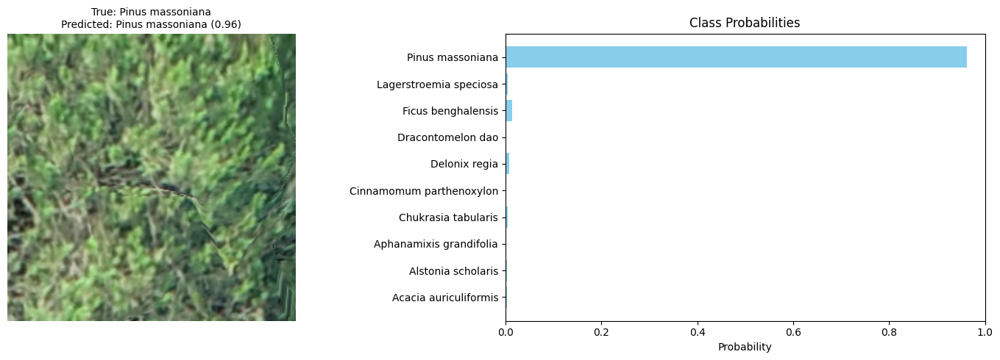

  Ảnh: 284_patch3.png -> Dự đoán: Pinus massoniana (Xác suất cao nhất: 0.96) ✅ Đúng


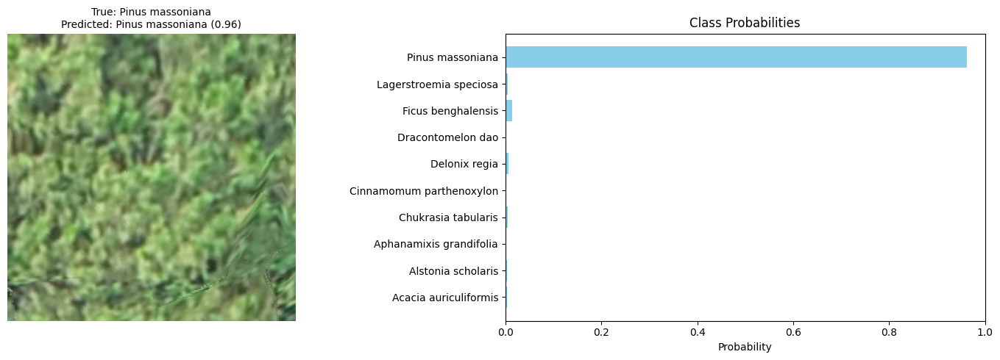

  Ảnh: 226_patch2.png -> Dự đoán: Pinus massoniana (Xác suất cao nhất: 0.84) ✅ Đúng


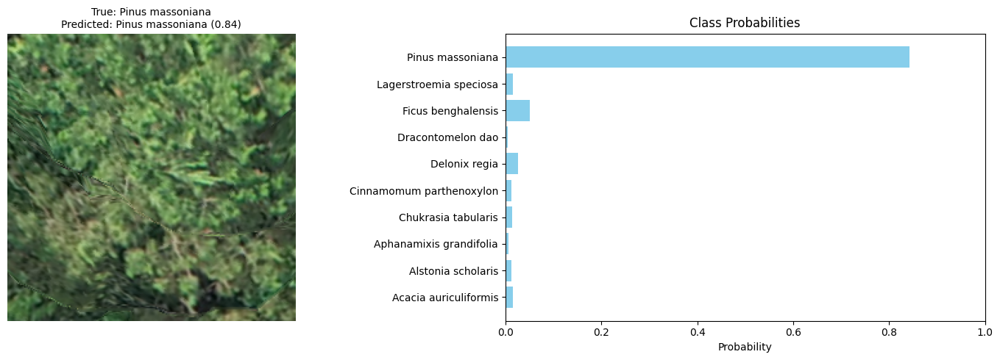

  Ảnh: 284_patch1.png -> Dự đoán: Pinus massoniana (Xác suất cao nhất: 0.96) ✅ Đúng


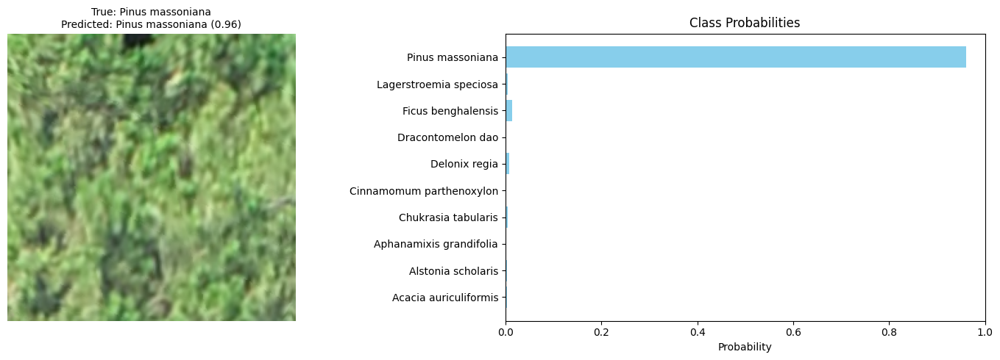

  Ảnh: 42_patch1.png -> Dự đoán: Pinus massoniana (Xác suất cao nhất: 0.94) ✅ Đúng


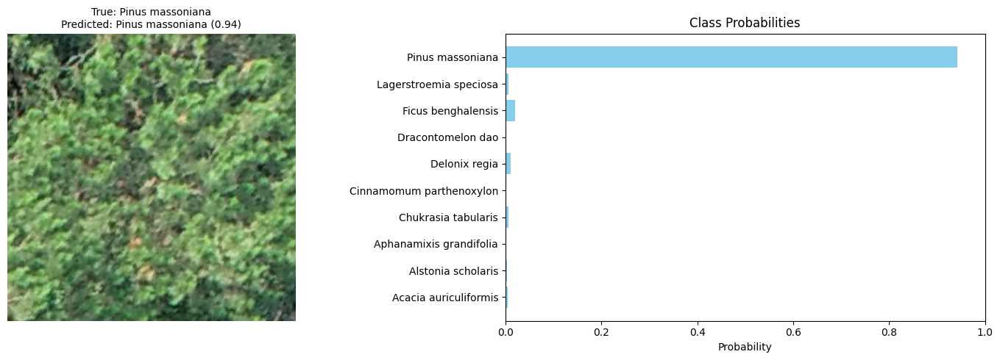

  Ảnh: 233_patch3.png -> Dự đoán: Pinus massoniana (Xác suất cao nhất: 0.95) ✅ Đúng


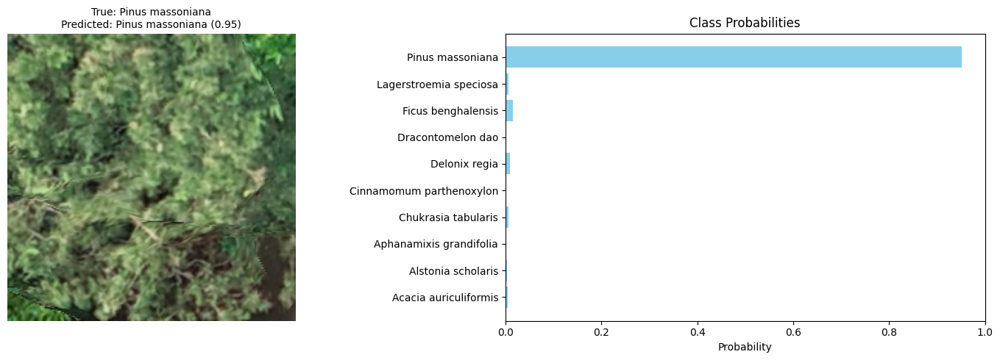

  Ảnh: 51_patch1.png -> Dự đoán: Cinnamomum parthenoxylon (Xác suất cao nhất: 0.25) ❌ Sai


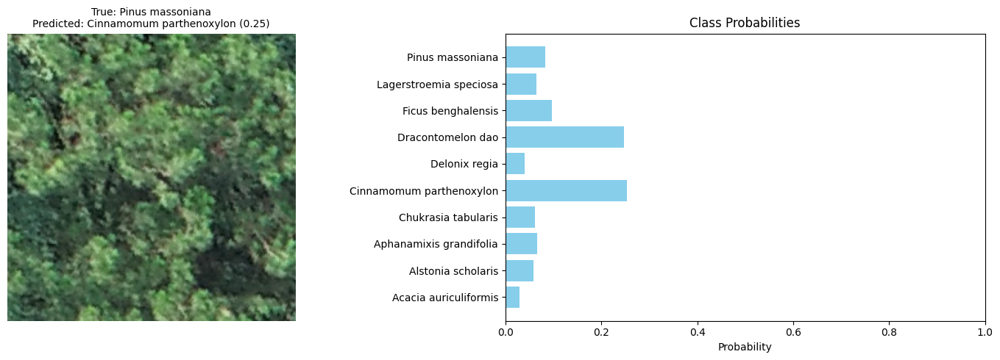

  Ảnh: 224_patch1.png -> Dự đoán: Pinus massoniana (Xác suất cao nhất: 0.96) ✅ Đúng


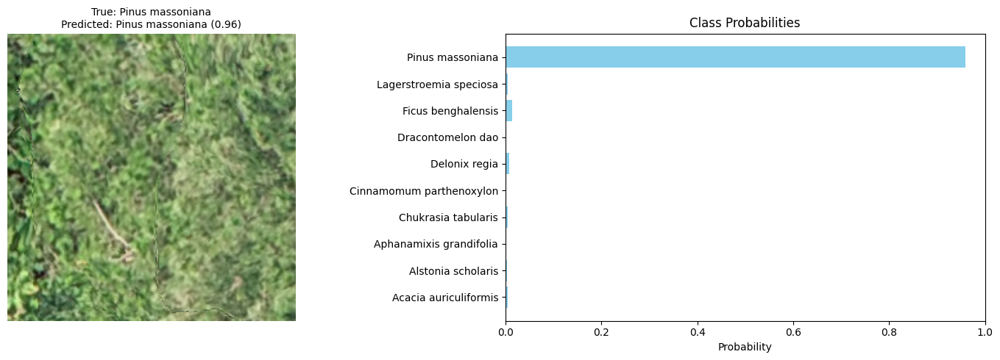

  Ảnh: 233_patch1.png -> Dự đoán: Pinus massoniana (Xác suất cao nhất: 0.38) ✅ Đúng


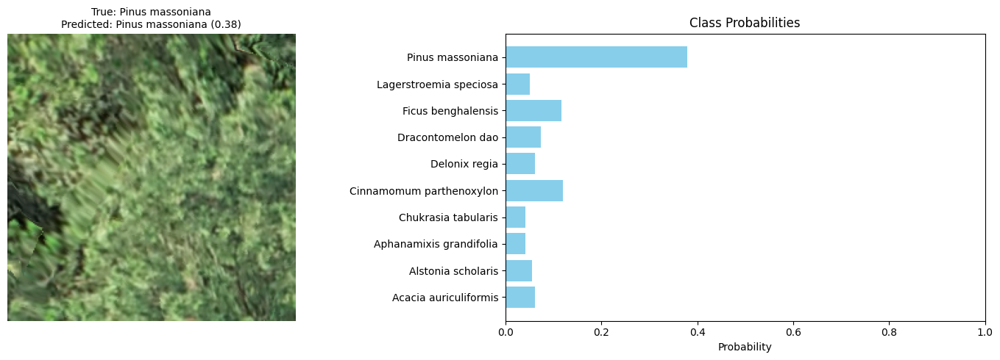

  Ảnh: 262_patch1.png -> Dự đoán: Pinus massoniana (Xác suất cao nhất: 0.96) ✅ Đúng


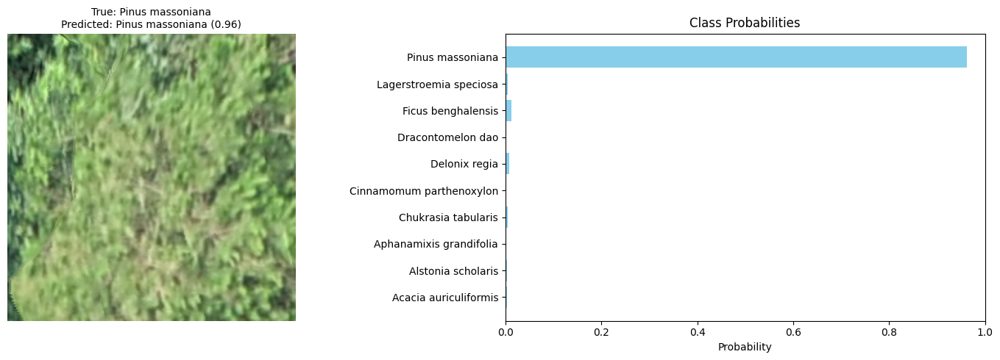

  Ảnh: 52_small.png -> Dự đoán: Dracontomelon dao (Xác suất cao nhất: 0.55) ❌ Sai


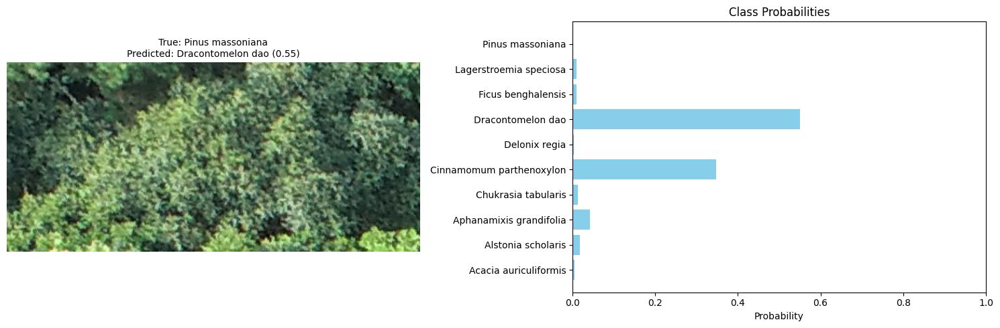

  Ảnh: 233_patch2.png -> Dự đoán: Cinnamomum parthenoxylon (Xác suất cao nhất: 0.36) ❌ Sai


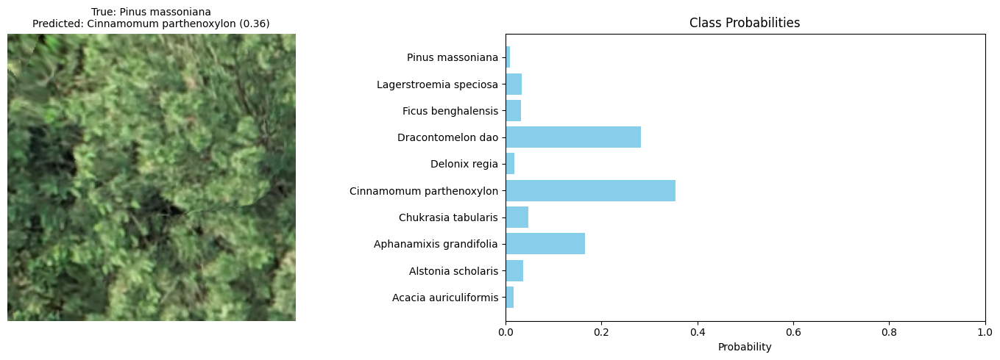

  Ảnh: 42_patch2.png -> Dự đoán: Pinus massoniana (Xác suất cao nhất: 0.88) ✅ Đúng


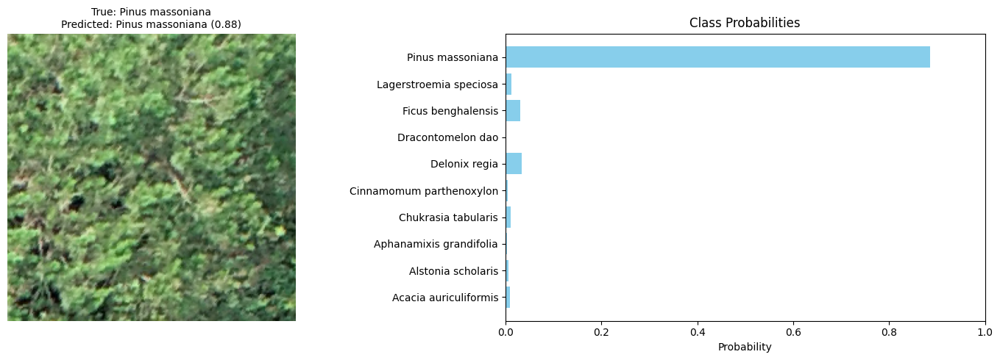

  Ảnh: 31_patch1.png -> Dự đoán: Pinus massoniana (Xác suất cao nhất: 0.94) ✅ Đúng


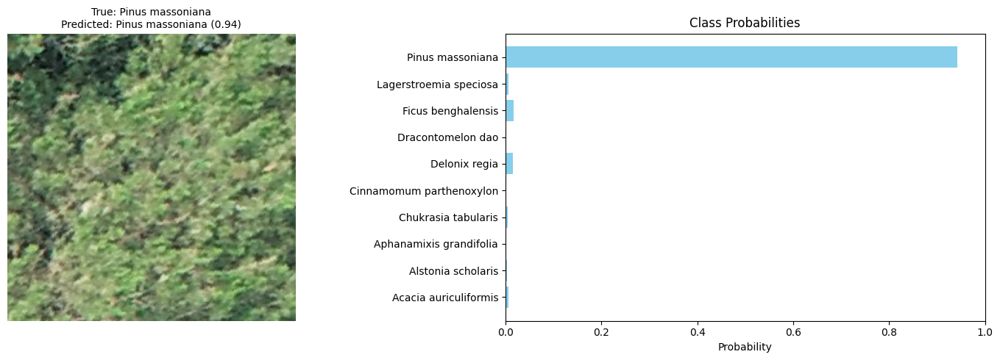

  Ảnh: 25_small.png -> Dự đoán: Pinus massoniana (Xác suất cao nhất: 0.96) ✅ Đúng


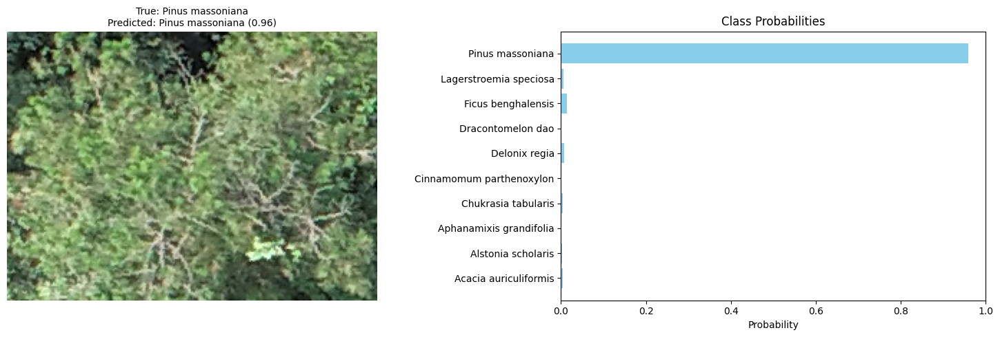

  Ảnh: 284_patch2.png -> Dự đoán: Pinus massoniana (Xác suất cao nhất: 0.96) ✅ Đúng


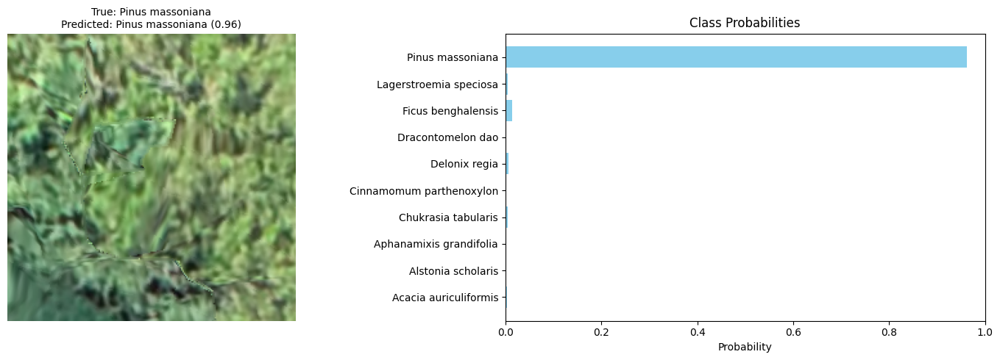

  Ảnh: 48_small.png -> Dự đoán: Acacia auriculiformis (Xác suất cao nhất: 0.35) ❌ Sai


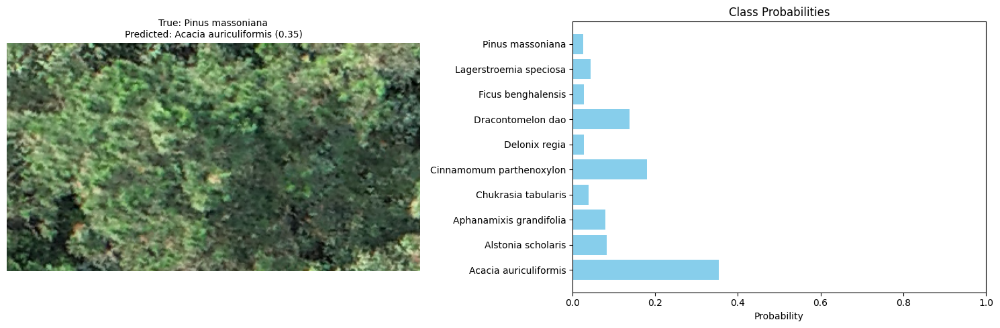

  Ảnh: 242_patch1.png -> Dự đoán: Pinus massoniana (Xác suất cao nhất: 0.96) ✅ Đúng


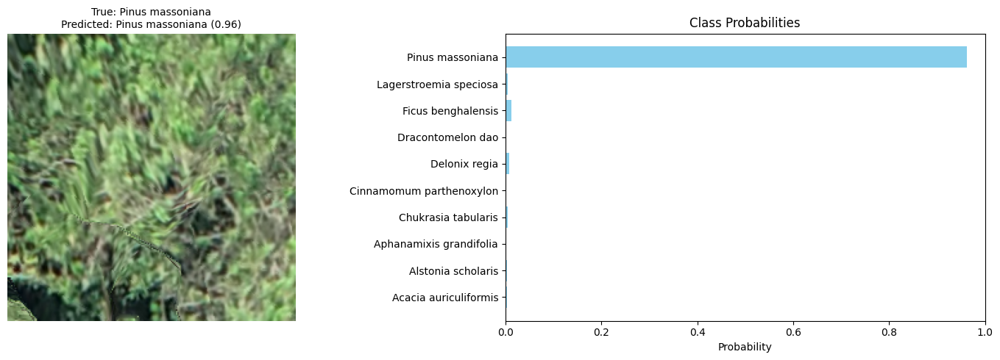

  Ảnh: 210_patch1.png -> Dự đoán: Pinus massoniana (Xác suất cao nhất: 0.96) ✅ Đúng


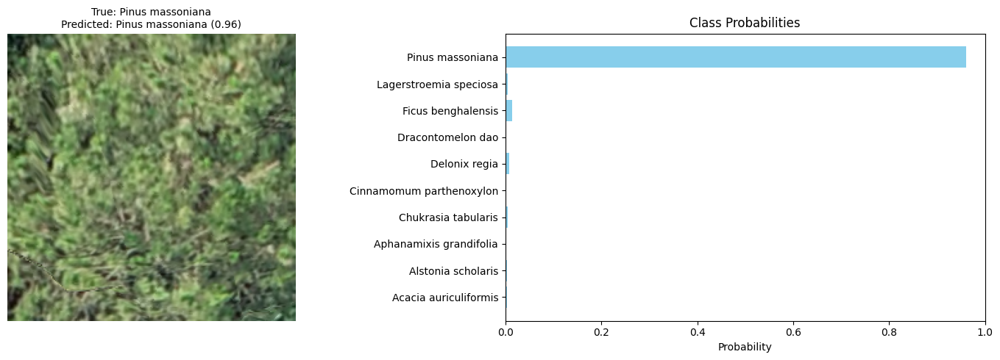


Tổng số ảnh đã dự đoán: 23
Số dự đoán đúng: 18
Độ chính xác cho thư mục 'Pinus massoniana': 78.26%
Hoàn thành quá trình dự đoán.


In [ ]:
import os
from PIL import Image
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np

PREDICT_FOLDER_PATH = "/content/VNUF-22052024-134-mix/Pinus massoniana" # Example: Predicting a single class

def predict_single_image(image_path, model, transform, device, class_names):
    model.eval() # Set model to evaluation mode
    image_pil = Image.open(image_path).convert("RGB")
    image_tensor = transform(image_pil).unsqueeze(0).to(device) # Add batch dimension and move to device

    with torch.no_grad():
        logits, _ = model(image_tensor)
        probabilities = F.softmax(logits, dim=1).squeeze().cpu().numpy() # Get probabilities for all classes
        predicted_idx = np.argmax(probabilities)
        predicted_class_name = class_names[predicted_idx]
        predicted_prob = probabilities[predicted_idx]

    return image_pil, predicted_class_name, predicted_prob, probabilities

# Ensure model_test, val_transform, DEVICE, and test_dataset.classes are available from previous cells
if 'model_test' not in globals() or 'val_transform' not in globals() or 'DEVICE' not in globals() or 'test_dataset' not in globals():
    print("❌ Lỗi: Các biến cần thiết (model_test, val_transform, DEVICE, test_dataset) chưa được định nghĩa. Vui lòng chạy lại các ô phía trên.")
else:
    class_names = test_dataset.classes
    correct_predictions = 0
    total_images = 0

    print(f"\nĐang dự đoán ảnh trong thư mục: {PREDICT_FOLDER_PATH}")
    true_label = os.path.basename(PREDICT_FOLDER_PATH) # Assuming folder name is the true label
    if true_label not in class_names:
        print(f"⚠️ Cảnh báo: Nhãn thực tế '{true_label}' được suy ra từ tên thư mục không có trong danh sách các lớp đã huấn luyện. Không thể tính toán độ chính xác.")
        true_label = None

    for filename in os.listdir(PREDICT_FOLDER_PATH):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            image_path = os.path.join(PREDICT_FOLDER_PATH, filename)

            image_pil, predicted_class_name, predicted_prob, all_probabilities = predict_single_image(
                image_path, model_test, val_transform, DEVICE, class_names
            )

            prediction_status = ""
            if true_label:
                if predicted_class_name == true_label:
                    correct_predictions += 1
                    prediction_status = "✅ Đúng"
                else:
                    prediction_status = "❌ Sai"
                total_images += 1

            print(f"  Ảnh: {filename} -> Dự đoán: {predicted_class_name} (Xác suất cao nhất: {predicted_prob:.2f}) {prediction_status}")

            # Plotting the image and probabilities
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

            # Display image
            ax1.imshow(image_pil)
            ax1.set_title(f"True: {true_label if true_label else 'N/A'}\nPredicted: {predicted_class_name} ({predicted_prob:.2f})", fontsize=10)
            ax1.axis('off')

            # Display probabilities
            ax2.barh(class_names, all_probabilities, color='skyblue')
            ax2.set_xlabel('Probability')
            ax2.set_title('Class Probabilities')
            ax2.set_xlim(0, 1) # Probabilities are between 0 and 1
            plt.tight_layout()
            plt.show()

    if total_images > 0:
        accuracy = (correct_predictions / total_images) * 100
        print(f"\nTổng số ảnh đã dự đoán: {total_images}")
        print(f"Số dự đoán đúng: {correct_predictions}")
        print(f"Độ chính xác cho thư mục '{true_label}': {accuracy:.2f}%")
    else:
        print("Không tìm thấy ảnh hợp lệ nào trong thư mục để dự đoán.")

print("Hoàn thành quá trình dự đoán.")

Số mẫu test: 788

─────────────────────────────────────────
8. FINAL EVALUATION ON TEST SET
─────────────────────────────────────────
Loaded best model from epoch 3 with val_acc=84.05%
Top-1 Accuracy: 85.28%
Top-3 Accuracy: 96.83%
Top-5 Accuracy: 98.86%

─────────────────────────────────────────
Confusion Matrix
─────────────────────────────────────────
[[136   0   1   1   1   0   0   0   0   0]
 [  0   8   0   0   0   0   0   0   0   0]
 [  1   0  80   1   1   0   4   0   0   0]
 [  0   0   4  79   4   1   7   0   0   0]
 [  0   0   0   0  32   0  34   0   0   0]
 [  0   0   0   0   0  29   0   0   0   0]
 [  0   0   0   0  11   0  57   0   0   0]
 [  0   0   1   0  16   0   0   0   0   0]
 [  0   0   4   8   0   0   0   0  70   0]
 [  7   0   2   1   3   0   0   1   2 181]]


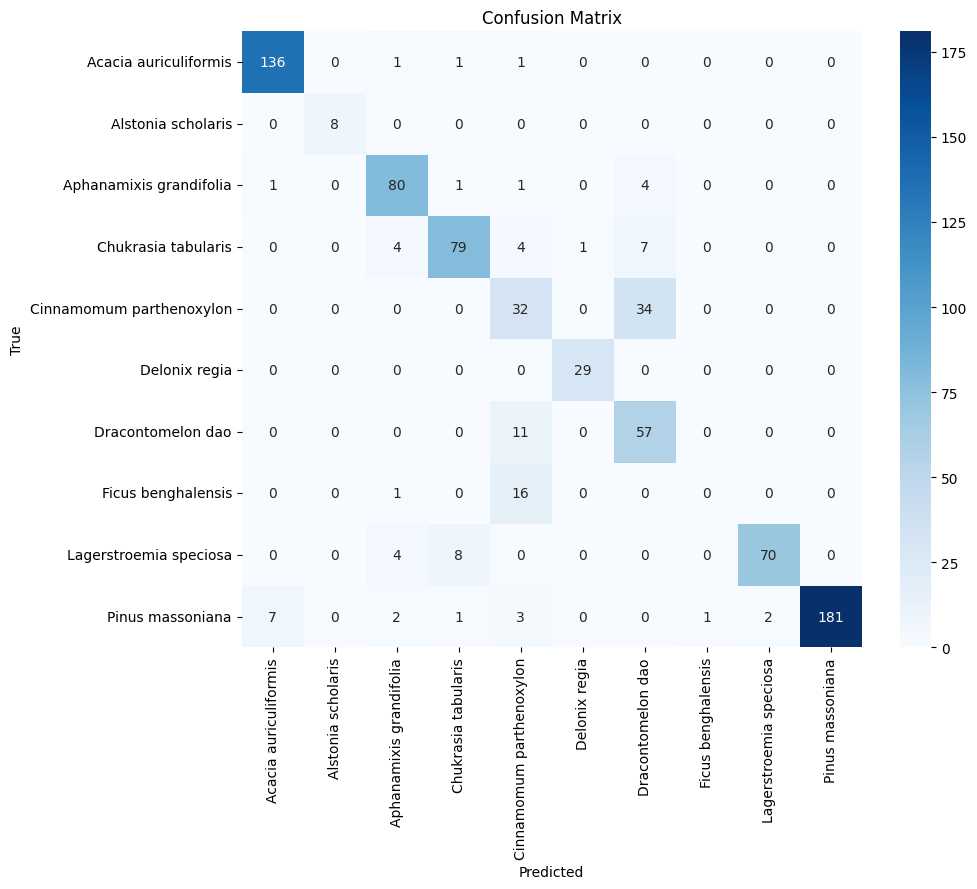


─────────────────────────────────────────
Classification Report
─────────────────────────────────────────
                          precision    recall  f1-score   support

   Acacia auriculiformis     0.9444    0.9784    0.9611       139
      Alstonia scholaris     1.0000    1.0000    1.0000         8
 Aphanamixis grandifolia     0.8696    0.9195    0.8939        87
     Chukrasia tabularis     0.8778    0.8316    0.8541        95
Cinnamomum parthenoxylon     0.4706    0.4848    0.4776        66
           Delonix regia     0.9667    1.0000    0.9831        29
       Dracontomelon dao     0.5588    0.8382    0.6706        68
      Ficus benghalensis     0.0000    0.0000    0.0000        17
  Lagerstroemia speciosa     0.9722    0.8537    0.9091        82
        Pinus massoniana     1.0000    0.9188    0.9577       197

                accuracy                         0.8528       788
               macro avg     0.7660    0.7825    0.7707       788
            weighted avg     0.85

In [ ]:
TEST_DIR   = "/content/VNUF-24082024-154/test" # Dedicated test set
test_dataset   = datasets.ImageFolder(TEST_DIR,   transform=val_transform)
test_loader   = DataLoader(test_dataset,   batch_size=32, shuffle=False,
                           num_workers=4, pin_memory=True)
print(f"Số mẫu test: {len(test_dataset)}")
# ─────────────────────────────────────────
# 8. FINAL EVALUATION ON TEST SET
# ─────────────────────────────────────────
print("\n─────────────────────────────────────────")
print("8. FINAL EVALUATION ON TEST SET")
print("─────────────────────────────────────────")

# Khởi tạo mô hình mới để tải trọng số
# Đảm bảo NUM_CLASSES, DEVICE đã được định nghĩa từ các cell trước
model_test = GeoIdTreeModel(num_classes=NUM_CLASSES).to(DEVICE)

# Load the best model
best_model_path = "/content/drive/MyDrive/cvbmc/model_chkpoint/1004/NONE_VNUF154_best_vit_base_patch16_dinov3.pth"
checkpoint = torch.load(best_model_path, map_location=DEVICE)
model_test.load_state_dict(checkpoint["model"])
print(f"Loaded best model from epoch {checkpoint['epoch']} with val_acc={checkpoint['val_acc']*100:.2f}%")

# Evaluate on test set
import torch.nn.functional as F
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

@torch.no_grad()
def evaluate_and_predict(model_to_eval, loader: DataLoader):
    model_to_eval.eval()
    all_preds = []
    all_labels = []
    all_logits = []

    correct_top1 = 0
    correct_top3 = 0
    correct_top5 = 0
    n = 0

    for imgs, labels in loader:
        imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
        logits, _ = model_to_eval(imgs) # Unpack the tuple here

        # Top-1
        preds = logits.argmax(1)
        correct_top1 += (preds == labels).sum().item()

        # Top-3
        top3 = logits.topk(3, dim=1).indices  # shape: (batch_size, 5)
        correct_top3 += (top3 == labels.unsqueeze(1)).any(dim=1).sum().item()

        # Top-5
        top5 = logits.topk(5, dim=1).indices  # shape: (batch_size, 5)
        correct_top5 += (top5 == labels.unsqueeze(1)).any(dim=1).sum().item()

        n += imgs.size(0)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        all_logits.append(logits.cpu().numpy())

    return {
        "acc_top1": correct_top1 / n,
        "acc_top3": correct_top3 / n,
        "acc_top5": correct_top5 / n,
        "predictions": all_preds,
        "labels": all_labels,
        "logits": np.concatenate(all_logits)
    }

test_results = evaluate_and_predict(model_test, test_loader)
test_acc_top1 = test_results["acc_top1"]
test_acc_top3 = test_results["acc_top3"]
test_acc_top5 = test_results["acc_top5"]

print(f"Top-1 Accuracy: {test_acc_top1*100:.2f}%")
print(f"Top-3 Accuracy: {test_acc_top3*100:.2f}%")
print(f"Top-5 Accuracy: {test_acc_top5*100:.2f}%")

test_acc_top1 = test_results["acc_top1"]
test_acc_top3 = test_results["acc_top3"]
test_acc_top5 = test_results["acc_top5"]
all_preds = test_results["predictions"]
all_labels = test_results["labels"]
all_logits = test_results["logits"]

# Generate Confusion Matrix
print("\n─────────────────────────────────────────")
print("Confusion Matrix")
print("─────────────────────────────────────────")
cm = confusion_matrix(all_labels, all_preds)
print(cm)

# Visualize Confusion Matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=test_dataset.classes, yticklabels=test_dataset.classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Generate Classification Report
print("\n─────────────────────────────────────────")
print("Classification Report")
print("─────────────────────────────────────────")
report = classification_report(all_labels, all_preds, target_names=test_dataset.classes, digits=4)
print(report)


🚀 Bắt đầu quá trình dự đoán ảnh đơn lẻ, hiển thị ảnh và xác suất từng lớp...

Đang dự đoán ảnh trong thư mục: /content/VNUF-24082024-154/test/Ficus benghalensis
  Ảnh: 592_patch1.png -> Dự đoán: Cinnamomum parthenoxylon (Xác suất cao nhất: 0.68) ❌ Sai


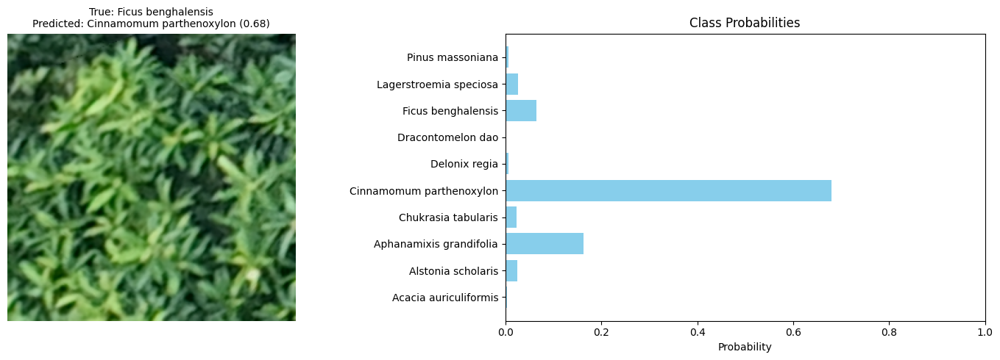

  Ảnh: 586_patch2.png -> Dự đoán: Cinnamomum parthenoxylon (Xác suất cao nhất: 0.56) ❌ Sai


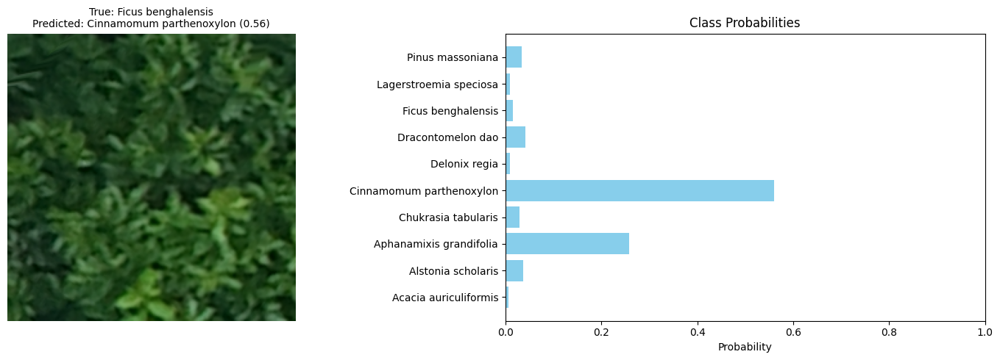

  Ảnh: 592_patch5.png -> Dự đoán: Cinnamomum parthenoxylon (Xác suất cao nhất: 0.82) ❌ Sai


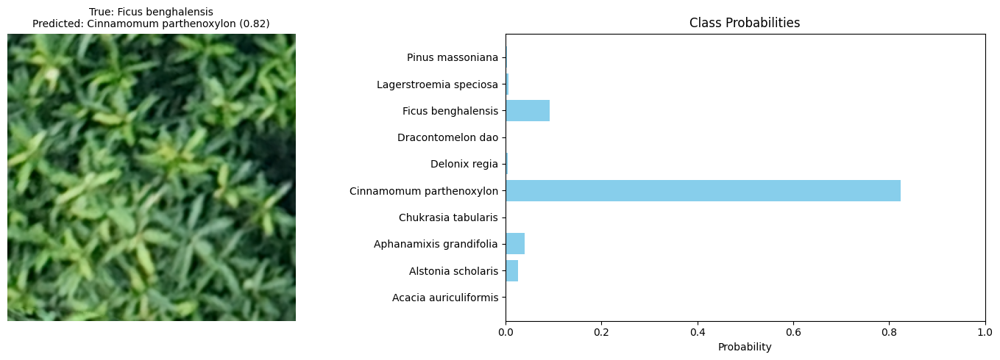

  Ảnh: 592_patch3.png -> Dự đoán: Cinnamomum parthenoxylon (Xác suất cao nhất: 0.56) ❌ Sai


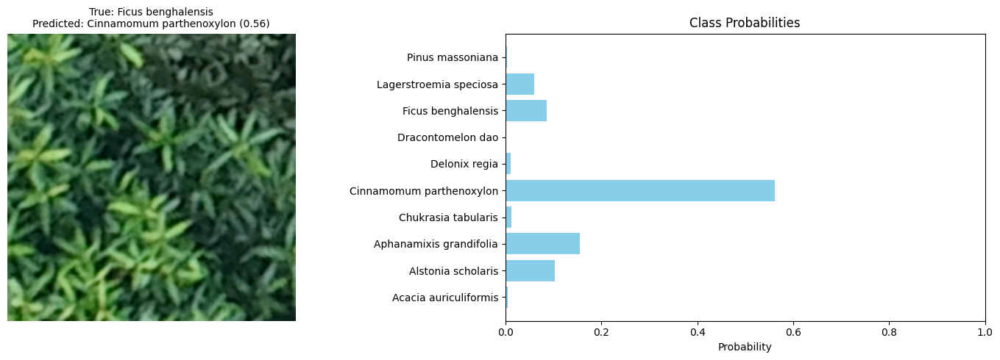

  Ảnh: 586_patch1.png -> Dự đoán: Aphanamixis grandifolia (Xác suất cao nhất: 0.50) ❌ Sai


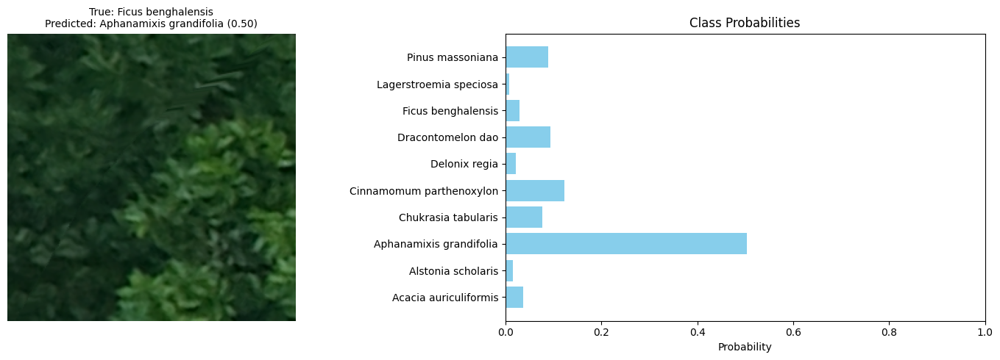

  Ảnh: 592_patch2.png -> Dự đoán: Cinnamomum parthenoxylon (Xác suất cao nhất: 0.74) ❌ Sai


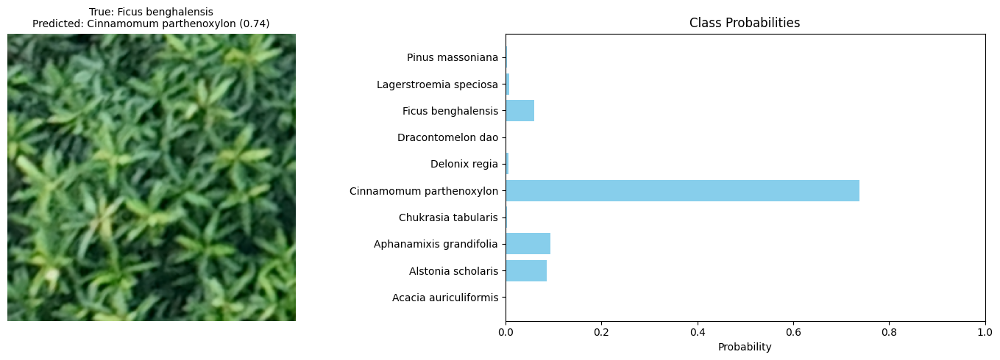

  Ảnh: 372_patch5.png -> Dự đoán: Cinnamomum parthenoxylon (Xác suất cao nhất: 0.90) ❌ Sai


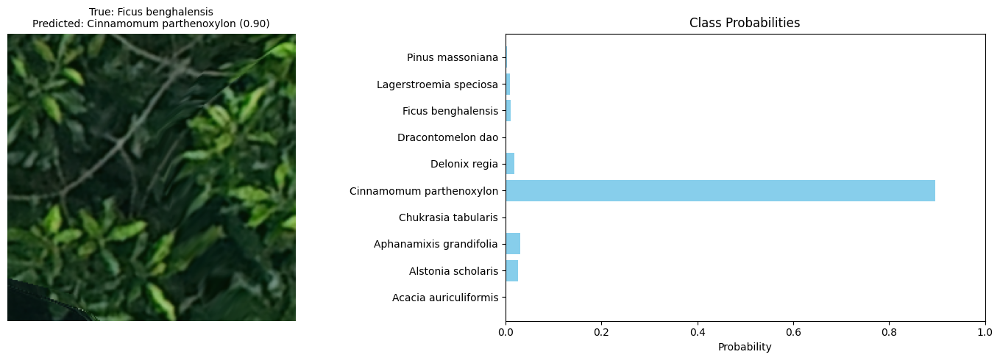

  Ảnh: 372_patch3.png -> Dự đoán: Cinnamomum parthenoxylon (Xác suất cao nhất: 0.66) ❌ Sai


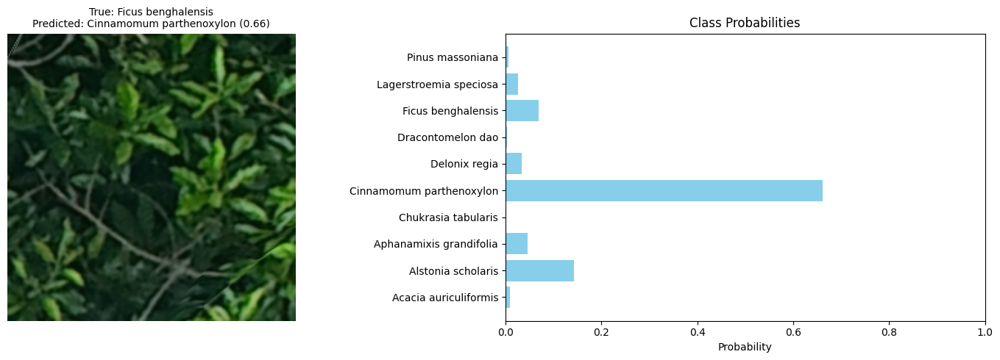

  Ảnh: 372_patch1.png -> Dự đoán: Cinnamomum parthenoxylon (Xác suất cao nhất: 0.41) ❌ Sai


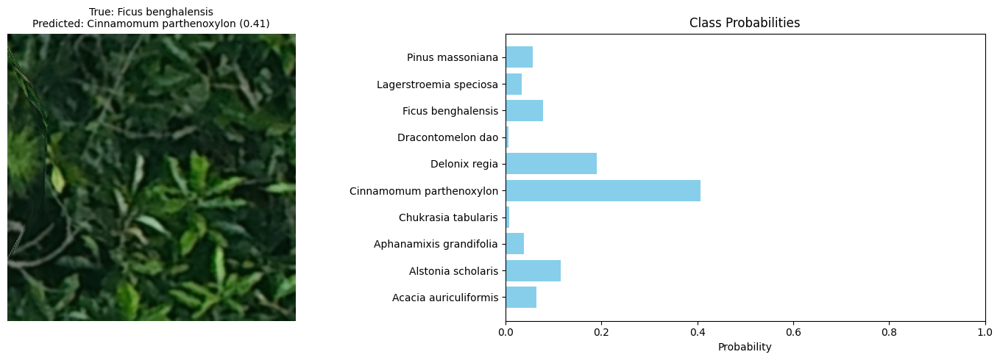

  Ảnh: 372_patch4.png -> Dự đoán: Cinnamomum parthenoxylon (Xác suất cao nhất: 0.89) ❌ Sai


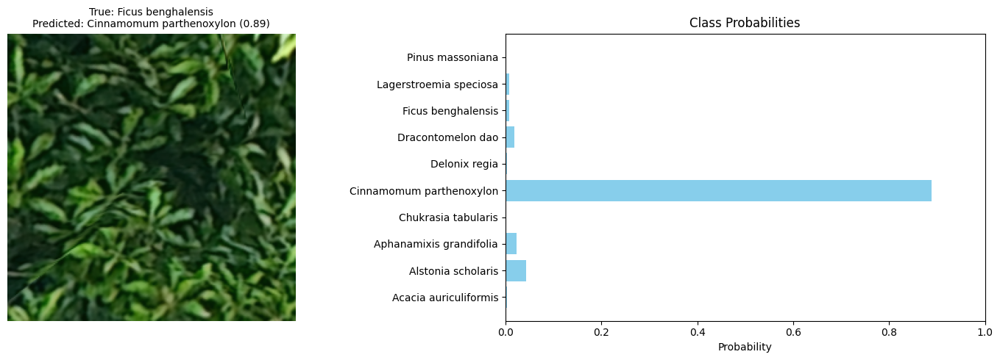

  Ảnh: 592_patch4.png -> Dự đoán: Cinnamomum parthenoxylon (Xác suất cao nhất: 0.91) ❌ Sai


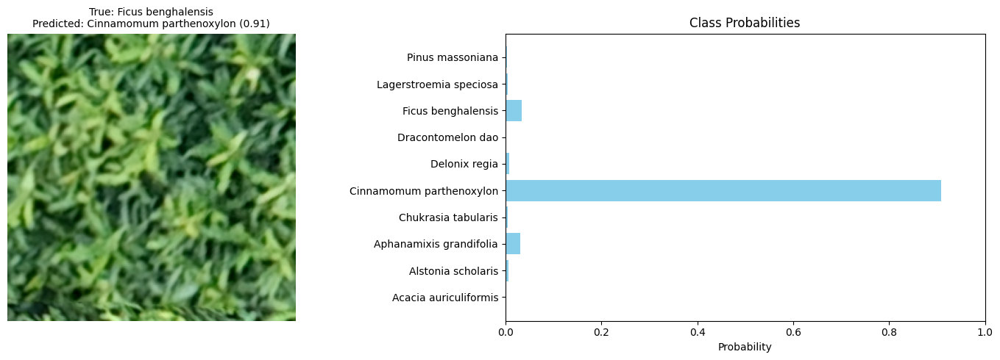

  Ảnh: 372_patch2.png -> Dự đoán: Cinnamomum parthenoxylon (Xác suất cao nhất: 0.40) ❌ Sai


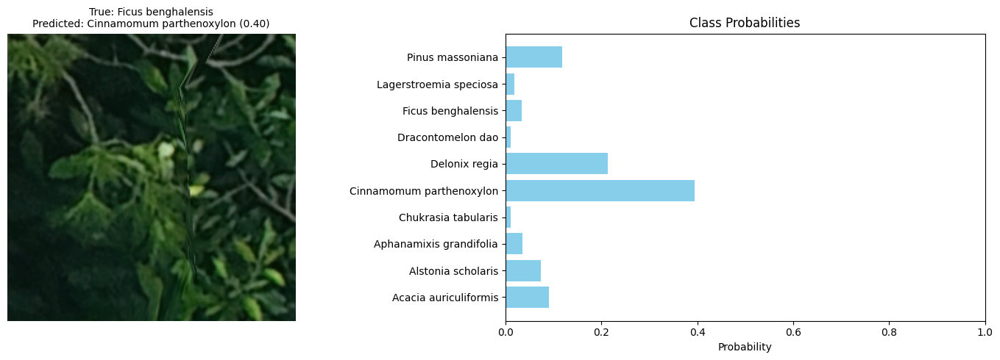

  Ảnh: 592_patch6.png -> Dự đoán: Cinnamomum parthenoxylon (Xác suất cao nhất: 0.77) ❌ Sai


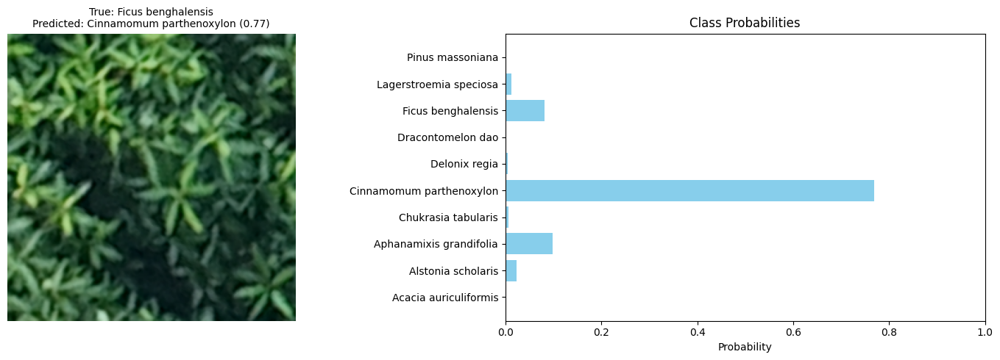

  Ảnh: 372_patch6.png -> Dự đoán: Cinnamomum parthenoxylon (Xác suất cao nhất: 0.92) ❌ Sai


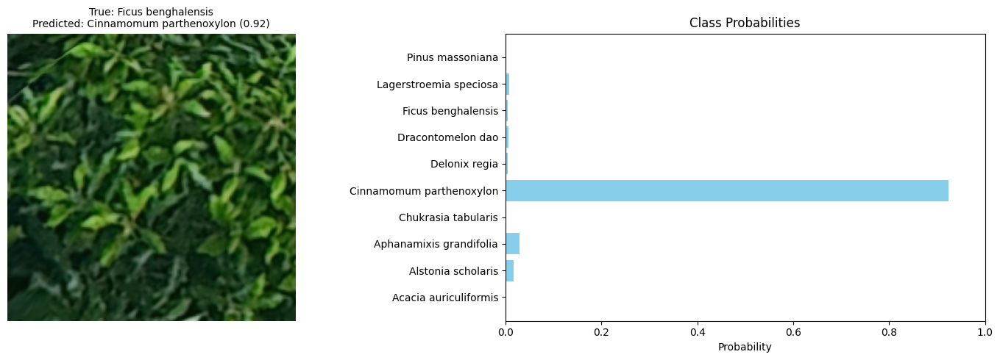

  Ảnh: 586_patch3.png -> Dự đoán: Cinnamomum parthenoxylon (Xác suất cao nhất: 0.30) ❌ Sai


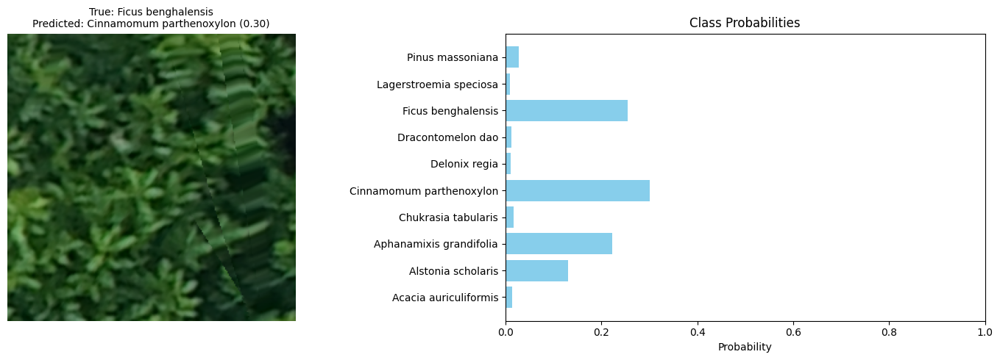

  Ảnh: 586_patch4.png -> Dự đoán: Cinnamomum parthenoxylon (Xác suất cao nhất: 0.54) ❌ Sai


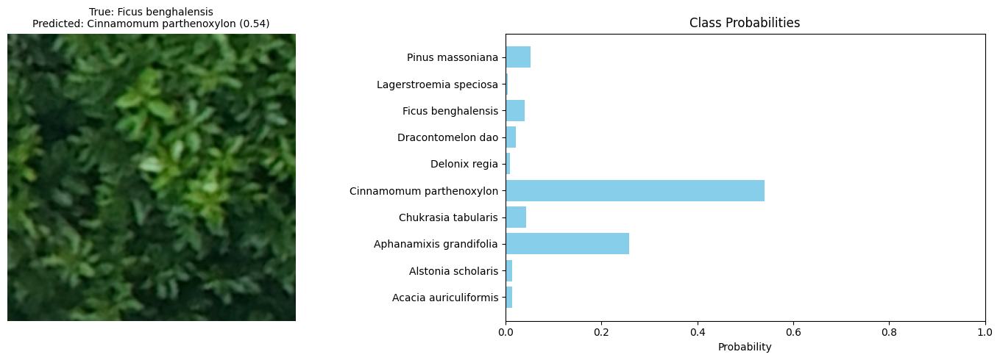

  Ảnh: 586_patch5.png -> Dự đoán: Cinnamomum parthenoxylon (Xác suất cao nhất: 0.56) ❌ Sai


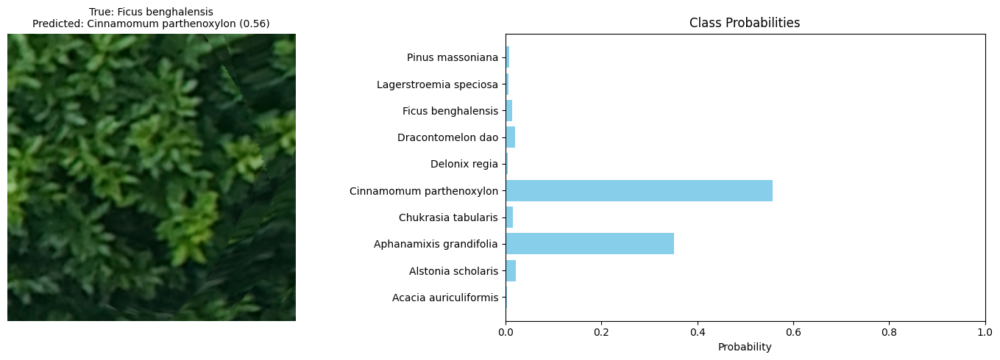


Tổng số ảnh đã dự đoán: 17
Số dự đoán đúng: 0
Độ chính xác cho thư mục 'Ficus benghalensis': 0.00%
Hoàn thành quá trình dự đoán.


In [ ]:
import os
from PIL import Image
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np

PREDICT_FOLDER_PATH = "/content/VNUF-24082024-154/test/Ficus benghalensis" # Example: Predicting a single class

print("🚀 Bắt đầu quá trình dự đoán ảnh đơn lẻ, hiển thị ảnh và xác suất từng lớp...")

def predict_single_image(image_path, model, transform, device, class_names):
    model.eval() # Set model to evaluation mode
    image_pil = Image.open(image_path).convert("RGB")
    image_tensor = transform(image_pil).unsqueeze(0).to(device) # Add batch dimension and move to device

    with torch.no_grad():
        logits, _ = model(image_tensor)
        probabilities = F.softmax(logits, dim=1).squeeze().cpu().numpy() # Get probabilities for all classes
        predicted_idx = np.argmax(probabilities)
        predicted_class_name = class_names[predicted_idx]
        predicted_prob = probabilities[predicted_idx]

    return image_pil, predicted_class_name, predicted_prob, probabilities

# Ensure model_test, val_transform, DEVICE, and test_dataset.classes are available from previous cells
if 'model_test' not in globals() or 'val_transform' not in globals() or 'DEVICE' not in globals() or 'test_dataset' not in globals():
    print("❌ Lỗi: Các biến cần thiết (model_test, val_transform, DEVICE, test_dataset) chưa được định nghĩa. Vui lòng chạy lại các ô phía trên.")
else:
    class_names = test_dataset.classes
    correct_predictions = 0
    total_images = 0

    print(f"\nĐang dự đoán ảnh trong thư mục: {PREDICT_FOLDER_PATH}")
    true_label = os.path.basename(PREDICT_FOLDER_PATH) # Assuming folder name is the true label
    if true_label not in class_names:
        print(f"⚠️ Cảnh báo: Nhãn thực tế '{true_label}' được suy ra từ tên thư mục không có trong danh sách các lớp đã huấn luyện. Không thể tính toán độ chính xác.")
        true_label = None

    for filename in os.listdir(PREDICT_FOLDER_PATH):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            image_path = os.path.join(PREDICT_FOLDER_PATH, filename)

            image_pil, predicted_class_name, predicted_prob, all_probabilities = predict_single_image(
                image_path, model_test, val_transform, DEVICE, class_names
            )

            prediction_status = ""
            if true_label:
                if predicted_class_name == true_label:
                    correct_predictions += 1
                    prediction_status = "✅ Đúng"
                else:
                    prediction_status = "❌ Sai"
                total_images += 1

            print(f"  Ảnh: {filename} -> Dự đoán: {predicted_class_name} (Xác suất cao nhất: {predicted_prob:.2f}) {prediction_status}")

            # Plotting the image and probabilities
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

            # Display image
            ax1.imshow(image_pil)
            ax1.set_title(f"True: {true_label if true_label else 'N/A'}\nPredicted: {predicted_class_name} ({predicted_prob:.2f})", fontsize=10)
            ax1.axis('off')

            # Display probabilities
            ax2.barh(class_names, all_probabilities, color='skyblue')
            ax2.set_xlabel('Probability')
            ax2.set_title('Class Probabilities')
            ax2.set_xlim(0, 1) # Probabilities are between 0 and 1
            plt.tight_layout()
            plt.show()

    if total_images > 0:
        accuracy = (correct_predictions / total_images) * 100
        print(f"\nTổng số ảnh đã dự đoán: {total_images}")
        print(f"Số dự đoán đúng: {correct_predictions}")
        print(f"Độ chính xác cho thư mục '{true_label}': {accuracy:.2f}%")
    else:
        print("Không tìm thấy ảnh hợp lệ nào trong thư mục để dự đoán.")

print("Hoàn thành quá trình dự đoán.")

📊 Confusion matrix saved to confusion_matrix.png


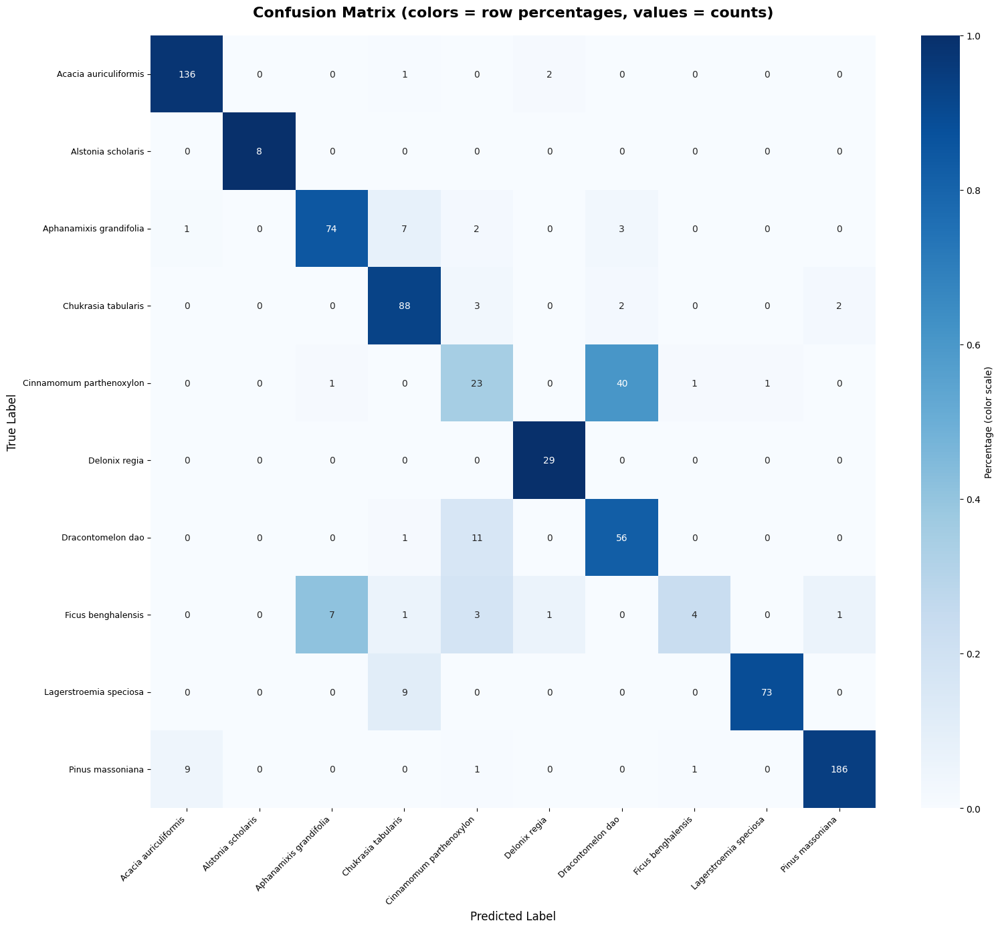

In [ ]:
def plot_confusion_matrix(test_labels, test_predicted, class_names,
                         save_path='confusion_matrix.png',
                         scientific_names=None, normalize_per_row=True):
    """Plot confusion matrix with smart color normalization

    Args:
        test_labels: True labels
        test_predicted: Predicted labels
        class_names: Original class names (folder names)
        save_path: Path to save the plot
        scientific_names: List of scientific names to display (if None, use class_names)
        normalize_per_row: If True, normalize colors by row percentage (better for imbalanced data)
    """
    cm = confusion_matrix(test_labels, test_predicted)

    # Use scientific names if provided, otherwise use original class names
    display_names = scientific_names if scientific_names is not None else class_names

    # Create figure
    fig, ax = plt.subplots(figsize=(16, 14))

    if normalize_per_row:
        # Calculate percentage for each row (for coloring only)
        cm_percent = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        cm_percent = np.nan_to_num(cm_percent)  # Handle division by zero

        # Use percentage values for coloring (0-1 scale)
        # But annotate with actual counts
        sns.heatmap(cm_percent,
                    annot=cm,  # Show counts
                    fmt='d',   # Integer format
                    cmap='Blues',
                    xticklabels=display_names,
                    yticklabels=display_names,
                    cbar_kws={'label': 'Percentage (color scale)'},
                    vmin=0,
                    vmax=1,
                    ax=ax)

        title = 'Confusion Matrix (colors = row percentages, values = counts)'
    else:
        # Standard confusion matrix without normalization
        sns.heatmap(cm,
                    annot=True,
                    fmt='d',
                    cmap='Blues',
                    xticklabels=display_names,
                    yticklabels=display_names,
                    cbar_kws={'label': 'Count'},
                    ax=ax)

        title = 'Confusion Matrix (Counts)'

    plt.title(title, fontsize=16, fontweight='bold', pad=20)
    plt.ylabel('True Label', fontsize=12)
    plt.xlabel('Predicted Label', fontsize=12)
    plt.xticks(rotation=45, ha='right', fontsize=9)
    plt.yticks(rotation=0, fontsize=9)
    plt.tight_layout()
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    print(f"📊 Confusion matrix saved to {save_path}")
    plt.show()


# Call the plot_confusion_matrix function
plot_confusion_matrix(all_labels, all_preds, test_dataset.classes)

Số mẫu test: 5544

─────────────────────────────────────────
8. FINAL EVALUATION ON TEST SET
─────────────────────────────────────────
Loaded best model from epoch 1 with val_acc=83.63%
Top-1 Accuracy: 79.82%
Top-3 Accuracy: 92.08%
Top-5 Accuracy: 93.47%

─────────────────────────────────────────
Confusion Matrix
─────────────────────────────────────────
[[1172    1   22    0   52    1   12    0    0    2]
 [   0   18    0    0    6    0   17    0    0    0]
 [   1    0  652    0    7    0   20    0    0    0]
 [   0    0   38  452    4    0    9    0    2    2]
 [   1    1   58    1  580    0  245    0    0    2]
 [   0    6   40    1   73   87    1  253    3    0]
 [   0    1   44    2  123    0  374    0    0    0]
 [   0    1    4    2   19    0    0   55    6    0]
 [   0    0    0   17    0    0    3    0   54    0]
 [   2    0    9    2    0    0    0    0    3  981]]


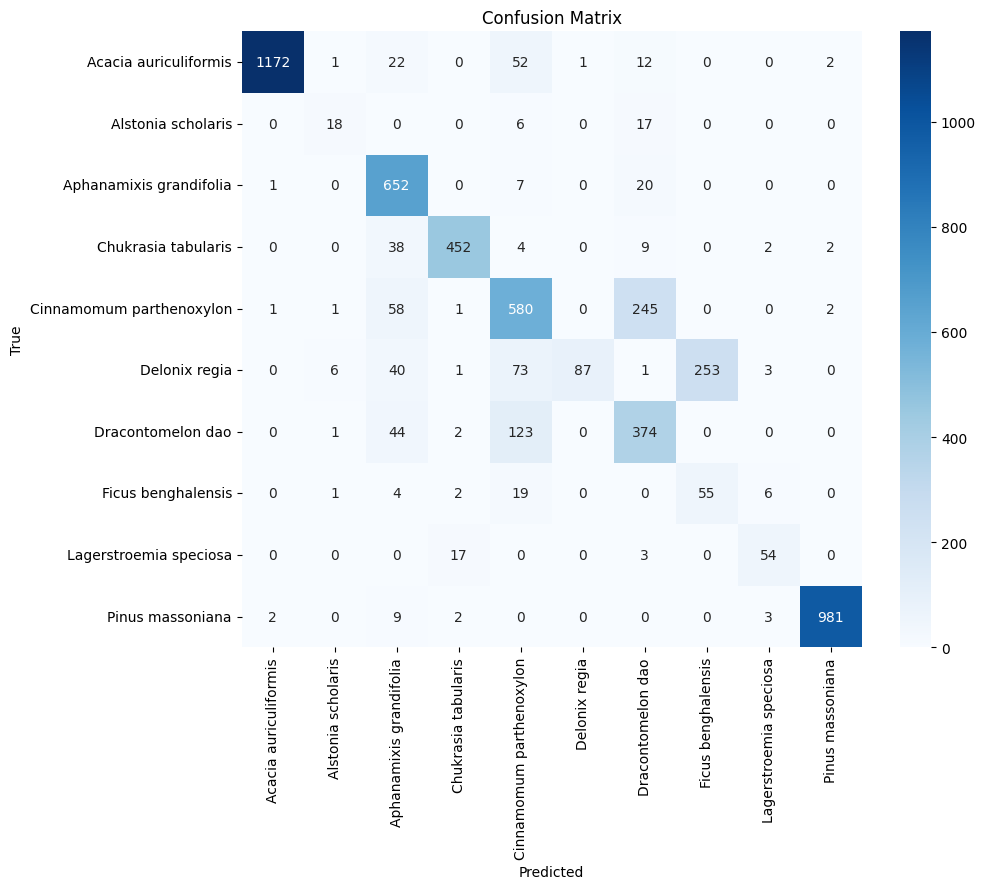


─────────────────────────────────────────
Classification Report
─────────────────────────────────────────
                          precision    recall  f1-score   support

   Acacia auriculiformis     0.9966    0.9287    0.9614      1262
      Alstonia scholaris     0.6429    0.4390    0.5217        41
 Aphanamixis grandifolia     0.7520    0.9588    0.8429       680
     Chukrasia tabularis     0.9476    0.8915    0.9187       507
Cinnamomum parthenoxylon     0.6713    0.6532    0.6621       888
           Delonix regia     0.9886    0.1875    0.3152       464
       Dracontomelon dao     0.5492    0.6875    0.6106       544
      Ficus benghalensis     0.1786    0.6322    0.2785        87
  Lagerstroemia speciosa     0.7941    0.7297    0.7606        74
        Pinus massoniana     0.9939    0.9840    0.9889       997

                accuracy                         0.7982      5544
               macro avg     0.7515    0.7092    0.6861      5544
            weighted avg     0.84

In [ ]:
TEST_DIR   = "/content/VNUF-24082024-299-mix" # Dedicated test set
test_dataset   = datasets.ImageFolder(TEST_DIR,   transform=val_transform)
test_loader   = DataLoader(test_dataset,   batch_size=32, shuffle=False,
                           num_workers=4, pin_memory=True)
print(f"Số mẫu test: {len(test_dataset)}")
# ─────────────────────────────────────────
# 8. FINAL EVALUATION ON TEST SET
# ─────────────────────────────────────────
print("\n─────────────────────────────────────────")
print("8. FINAL EVALUATION ON TEST SET")
print("─────────────────────────────────────────")

# Khởi tạo mô hình mới để tải trọng số
# Đảm bảo NUM_CLASSES, DEVICE đã được định nghĩa từ các cell trước
model_test = GeoIdTreeModel(num_classes=NUM_CLASSES).to(DEVICE)

# Load the best model
best_model_path = "/content/drive/MyDrive/cvbmc/model_chkpoint/2104/CORAL_TRIPLET_CENTER_VNUF154_10species_best_vit_base_patch16_dinov3.pth"
checkpoint = torch.load(best_model_path, map_location=DEVICE)
model_test.load_state_dict(checkpoint["model"])
print(f"Loaded best model from epoch {checkpoint['epoch']} with val_acc={checkpoint['val_acc']*100:.2f}%")

# Evaluate on test set
import torch.nn.functional as F
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

@torch.no_grad()
def evaluate_and_predict(model_to_eval, loader: DataLoader):
    model_to_eval.eval()
    all_preds = []
    all_labels = []
    all_logits = []

    correct_top1 = 0
    correct_top3 = 0
    correct_top5 = 0
    n = 0

    for imgs, labels in loader:
        imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
        logits, _ = model_to_eval(imgs) # Unpack the tuple here

        # Top-1
        preds = logits.argmax(1)
        correct_top1 += (preds == labels).sum().item()

        # Top-3
        top3 = logits.topk(3, dim=1).indices  # shape: (batch_size, 5)
        correct_top3 += (top3 == labels.unsqueeze(1)).any(dim=1).sum().item()

        # Top-5
        top5 = logits.topk(5, dim=1).indices  # shape: (batch_size, 5)
        correct_top5 += (top5 == labels.unsqueeze(1)).any(dim=1).sum().item()

        n += imgs.size(0)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        all_logits.append(logits.cpu().numpy())

    return {
        "acc_top1": correct_top1 / n,
        "acc_top3": correct_top3 / n,
        "acc_top5": correct_top5 / n,
        "predictions": all_preds,
        "labels": all_labels,
        "logits": np.concatenate(all_logits)
    }

test_results = evaluate_and_predict(model_test, test_loader)
test_acc_top1 = test_results["acc_top1"]
test_acc_top3 = test_results["acc_top3"]
test_acc_top5 = test_results["acc_top5"]

print(f"Top-1 Accuracy: {test_acc_top1*100:.2f}%")
print(f"Top-3 Accuracy: {test_acc_top3*100:.2f}%")
print(f"Top-5 Accuracy: {test_acc_top5*100:.2f}%")

test_acc_top1 = test_results["acc_top1"]
test_acc_top3 = test_results["acc_top3"]
test_acc_top5 = test_results["acc_top5"]
all_preds = test_results["predictions"]
all_labels = test_results["labels"]
all_logits = test_results["logits"]

# Generate Confusion Matrix
print("\n─────────────────────────────────────────")
print("Confusion Matrix")
print("─────────────────────────────────────────")
cm = confusion_matrix(all_labels, all_preds)
print(cm)

# Visualize Confusion Matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=test_dataset.classes, yticklabels=test_dataset.classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Generate Classification Report
print("\n─────────────────────────────────────────")
print("Classification Report")
print("─────────────────────────────────────────")
report = classification_report(all_labels, all_preds, target_names=test_dataset.classes, digits=4)
print(report)


📊 Confusion matrix saved to confusion_matrix.png


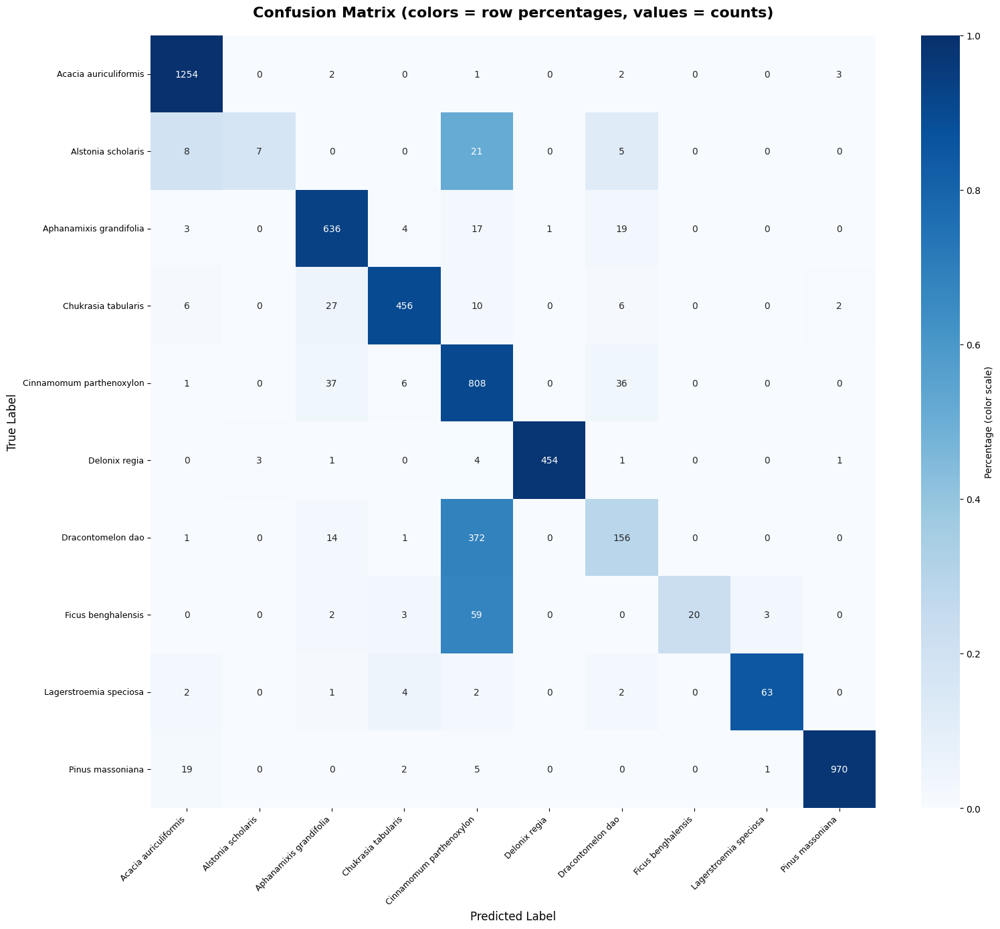

In [ ]:
def plot_confusion_matrix(test_labels, test_predicted, class_names,
                         save_path='confusion_matrix.png',
                         scientific_names=None, normalize_per_row=True):
    """Plot confusion matrix with smart color normalization

    Args:
        test_labels: True labels
        test_predicted: Predicted labels
        class_names: Original class names (folder names)
        save_path: Path to save the plot
        scientific_names: List of scientific names to display (if None, use class_names)
        normalize_per_row: If True, normalize colors by row percentage (better for imbalanced data)
    """
    cm = confusion_matrix(test_labels, test_predicted)

    # Use scientific names if provided, otherwise use original class names
    display_names = scientific_names if scientific_names is not None else class_names

    # Create figure
    fig, ax = plt.subplots(figsize=(16, 14))

    if normalize_per_row:
        # Calculate percentage for each row (for coloring only)
        cm_percent = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        cm_percent = np.nan_to_num(cm_percent)  # Handle division by zero

        # Use percentage values for coloring (0-1 scale)
        # But annotate with actual counts
        sns.heatmap(cm_percent,
                    annot=cm,  # Show counts
                    fmt='d',   # Integer format
                    cmap='Blues',
                    xticklabels=display_names,
                    yticklabels=display_names,
                    cbar_kws={'label': 'Percentage (color scale)'},
                    vmin=0,
                    vmax=1,
                    ax=ax)

        title = 'Confusion Matrix (colors = row percentages, values = counts)'
    else:
        # Standard confusion matrix without normalization
        sns.heatmap(cm,
                    annot=True,
                    fmt='d',
                    cmap='Blues',
                    xticklabels=display_names,
                    yticklabels=display_names,
                    cbar_kws={'label': 'Count'},
                    ax=ax)

        title = 'Confusion Matrix (Counts)'

    plt.title(title, fontsize=16, fontweight='bold', pad=20)
    plt.ylabel('True Label', fontsize=12)
    plt.xlabel('Predicted Label', fontsize=12)
    plt.xticks(rotation=45, ha='right', fontsize=9)
    plt.yticks(rotation=0, fontsize=9)
    plt.tight_layout()
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    print(f"📊 Confusion matrix saved to {save_path}")
    plt.show()


# Call the plot_confusion_matrix function
plot_confusion_matrix(all_labels, all_preds, test_dataset.classes)

Số mẫu test: 98

─────────────────────────────────────────
8. FINAL EVALUATION ON TEST SET
─────────────────────────────────────────
Loaded best model from epoch 27 with val_acc=87.95%
Top-1 Accuracy: 38.78%
Top-3 Accuracy: 57.14%
Top-5 Accuracy: 69.39%

─────────────────────────────────────────
Confusion Matrix
─────────────────────────────────────────
[[ 8  0  3  0  2  0 10  0  0  0]
 [ 0  0  0  1  0  0  0  0  0  0]
 [ 0  0 10  3  1  1  2  0  0  0]
 [ 1  0  3  1  0  0  2  0  0  0]
 [ 0  0  2  3  2  0  5  0  0  0]
 [ 0  0  0  0  0  2  0  0  0  0]
 [ 1  0  0  0  1  0  6  0  0  0]
 [ 0  0  2  0  0  0  1  0  0  0]
 [ 0  0  4  3  0  0  1  0  0  0]
 [ 1  0  0  4  2  0  1  0  0  9]]


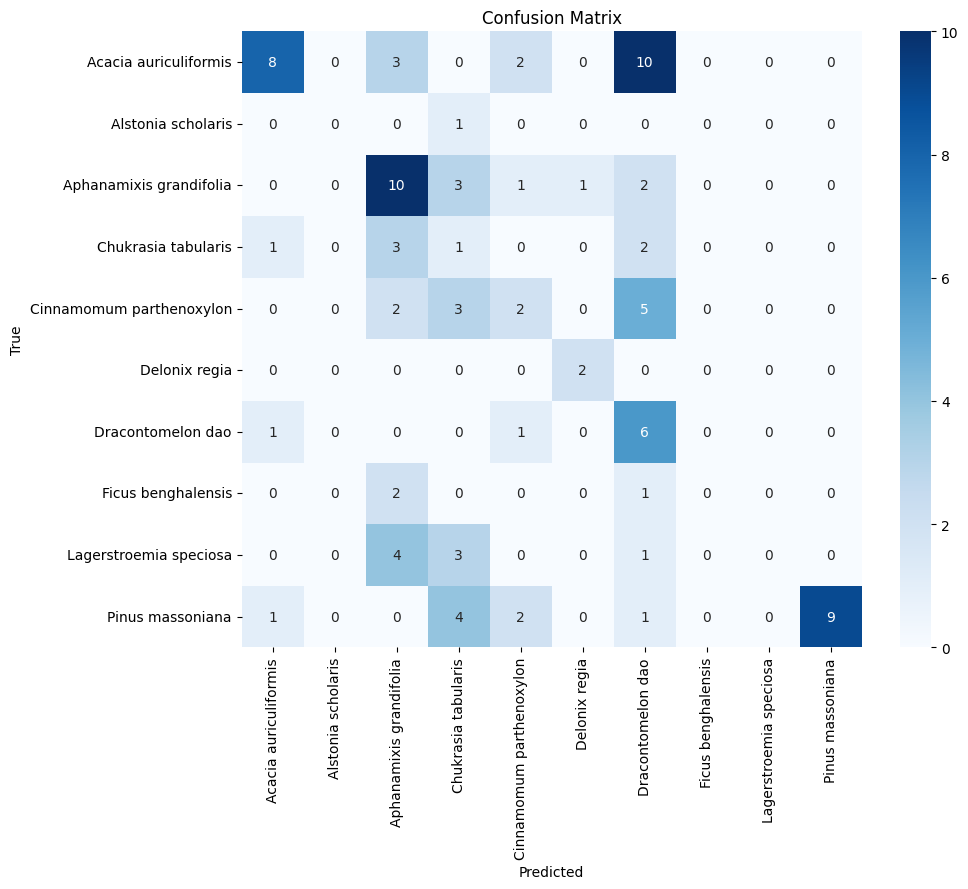


─────────────────────────────────────────
Classification Report
─────────────────────────────────────────
                          precision    recall  f1-score   support

   Acacia auriculiformis     0.7273    0.3478    0.4706        23
      Alstonia scholaris     0.0000    0.0000    0.0000         1
 Aphanamixis grandifolia     0.4167    0.5882    0.4878        17
     Chukrasia tabularis     0.0667    0.1429    0.0909         7
Cinnamomum parthenoxylon     0.2500    0.1667    0.2000        12
           Delonix regia     0.6667    1.0000    0.8000         2
       Dracontomelon dao     0.2143    0.7500    0.3333         8
      Ficus benghalensis     0.0000    0.0000    0.0000         3
  Lagerstroemia speciosa     0.0000    0.0000    0.0000         8
        Pinus massoniana     1.0000    0.5294    0.6923        17

                accuracy                         0.3878        98
               macro avg     0.3342    0.3525    0.3075        98
            weighted avg     0.48

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
TEST_DIR   = "/content/VNUF-10082024-234/test" # Dedicated test set
test_dataset   = datasets.ImageFolder(TEST_DIR,   transform=val_transform)
test_loader   = DataLoader(test_dataset,   batch_size=32, shuffle=False,
                           num_workers=4, pin_memory=True)
print(f"Số mẫu test: {len(test_dataset)}")
# ─────────────────────────────────────────
# 8. FINAL EVALUATION ON TEST SET
# ─────────────────────────────────────────
print("\n─────────────────────────────────────────")
print("8. FINAL EVALUATION ON TEST SET")
print("─────────────────────────────────────────")

# Khởi tạo mô hình mới để tải trọng số
# Đảm bảo NUM_CLASSES, DEVICE đã được định nghĩa từ các cell trước
model_test = GeoIdTreeModel(num_classes=NUM_CLASSES).to(DEVICE)

# Load the best model
best_model_path = "/content/drive/MyDrive/cvbmc/model_chkpoint/2104/CORAL_TRIPLET_CENTER_VNUF154_10species_best_vit_base_patch16_dinov3.pth"
checkpoint = torch.load(best_model_path, map_location=DEVICE)
model_test.load_state_dict(checkpoint["model"])
print(f"Loaded best model from epoch {checkpoint['epoch']} with val_acc={checkpoint['val_acc']*100:.2f}%")

# Evaluate on test set
import torch.nn.functional as F
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

@torch.no_grad()
def evaluate_and_predict(model_to_eval, loader: DataLoader):
    model_to_eval.eval()
    all_preds = []
    all_labels = []
    all_logits = []

    correct_top1 = 0
    correct_top3 = 0
    correct_top5 = 0
    n = 0

    for imgs, labels in loader:
        imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
        logits, _ = model_to_eval(imgs) # Unpack the tuple here

        # Top-1
        preds = logits.argmax(1)
        correct_top1 += (preds == labels).sum().item()

        # Top-3
        top3 = logits.topk(3, dim=1).indices  # shape: (batch_size, 5)
        correct_top3 += (top3 == labels.unsqueeze(1)).any(dim=1).sum().item()

        # Top-5
        top5 = logits.topk(5, dim=1).indices  # shape: (batch_size, 5)
        correct_top5 += (top5 == labels.unsqueeze(1)).any(dim=1).sum().item()

        n += imgs.size(0)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        all_logits.append(logits.cpu().numpy())

    return {
        "acc_top1": correct_top1 / n,
        "acc_top3": correct_top3 / n,
        "acc_top5": correct_top5 / n,
        "predictions": all_preds,
        "labels": all_labels,
        "logits": np.concatenate(all_logits)
    }

test_results = evaluate_and_predict(model_test, test_loader)
test_acc_top1 = test_results["acc_top1"]
test_acc_top3 = test_results["acc_top3"]
test_acc_top5 = test_results["acc_top5"]

print(f"Top-1 Accuracy: {test_acc_top1*100:.2f}%")
print(f"Top-3 Accuracy: {test_acc_top3*100:.2f}%")
print(f"Top-5 Accuracy: {test_acc_top5*100:.2f}%")

test_acc_top1 = test_results["acc_top1"]
test_acc_top3 = test_results["acc_top3"]
test_acc_top5 = test_results["acc_top5"]
all_preds = test_results["predictions"]
all_labels = test_results["labels"]
all_logits = test_results["logits"]

# Generate Confusion Matrix
print("\n─────────────────────────────────────────")
print("Confusion Matrix")
print("─────────────────────────────────────────")
cm = confusion_matrix(all_labels, all_preds)
print(cm)

# Visualize Confusion Matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=test_dataset.classes, yticklabels=test_dataset.classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Generate Classification Report
print("\n─────────────────────────────────────────")
print("Classification Report")
print("─────────────────────────────────────────")
report = classification_report(all_labels, all_preds, target_names=test_dataset.classes, digits=4)
print(report)


Số mẫu test: 505

─────────────────────────────────────────
8. FINAL EVALUATION ON TEST SET
─────────────────────────────────────────
Loaded best model from epoch 27 with val_acc=87.95%
Top-1 Accuracy: 46.14%
Top-3 Accuracy: 76.63%
Top-5 Accuracy: 84.75%

─────────────────────────────────────────
Confusion Matrix
─────────────────────────────────────────
[[124   0   9   0   8   2  26   0   0   1]
 [  1   0   0   0   0   0   3   0   0   0]
 [  0   0  26   0   3   0  36   0   0   0]
 [  0   0   0   6   3   0  14   0   0   0]
 [  0   0  25   1   4   0  45   0   0   0]
 [  8   0   5   2  11  55   4   0   0   3]
 [  4   0  24   0   1   0  14   0   0   0]
 [  2   0   0   0   4   0   1   0   0   0]
 [  0   0   2   2   0   0   3   0   0   0]
 [  2   0   0   1   8   0   8   0   0   4]]


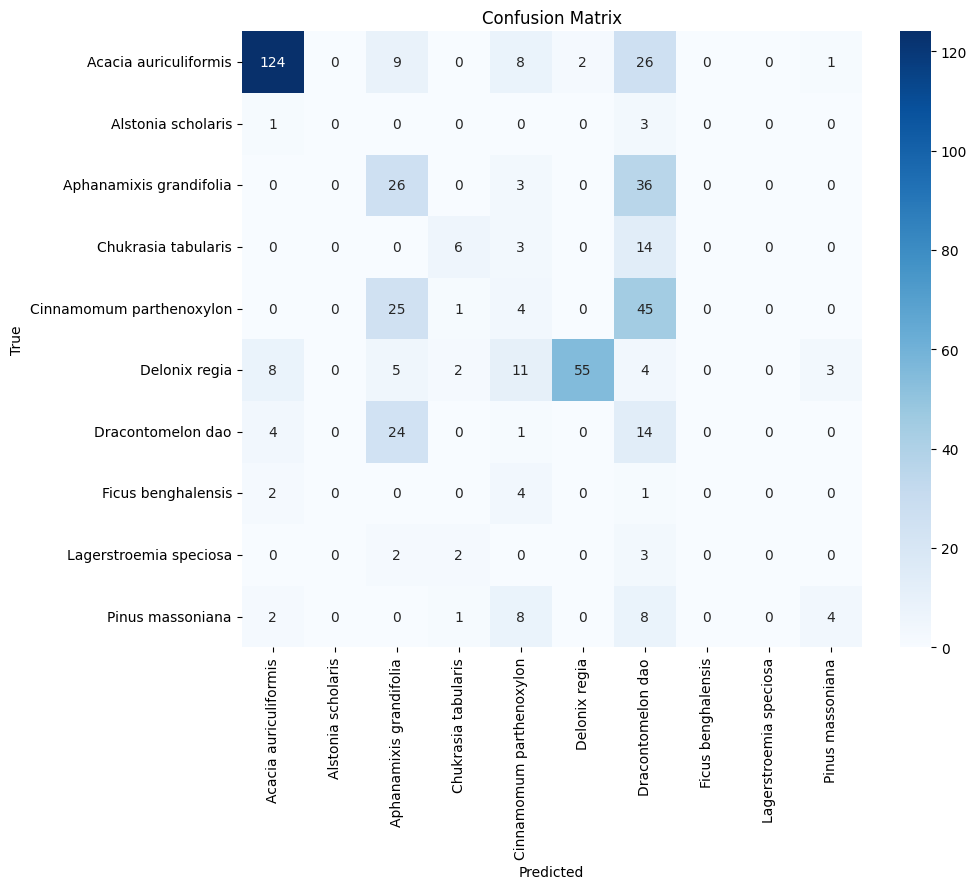


─────────────────────────────────────────
Classification Report
─────────────────────────────────────────
                          precision    recall  f1-score   support

   Acacia auriculiformis     0.8794    0.7294    0.7974       170
      Alstonia scholaris     0.0000    0.0000    0.0000         4
 Aphanamixis grandifolia     0.2857    0.4000    0.3333        65
     Chukrasia tabularis     0.5000    0.2609    0.3429        23
Cinnamomum parthenoxylon     0.0952    0.0533    0.0684        75
           Delonix regia     0.9649    0.6250    0.7586        88
       Dracontomelon dao     0.0909    0.3256    0.1421        43
      Ficus benghalensis     0.0000    0.0000    0.0000         7
  Lagerstroemia speciosa     0.0000    0.0000    0.0000         7
        Pinus massoniana     0.5000    0.1739    0.2581        23

                accuracy                         0.4614       505
               macro avg     0.3316    0.2568    0.2701       505
            weighted avg     0.56

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
TEST_DIR   = "/content/VNUF-22052024-134-mix" # Dedicated test set
test_dataset   = datasets.ImageFolder(TEST_DIR,   transform=val_transform)
test_loader   = DataLoader(test_dataset,   batch_size=32, shuffle=False,
                           num_workers=4, pin_memory=True)
print(f"Số mẫu test: {len(test_dataset)}")
# ─────────────────────────────────────────
# 8. FINAL EVALUATION ON TEST SET
# ─────────────────────────────────────────
print("\n─────────────────────────────────────────")
print("8. FINAL EVALUATION ON TEST SET")
print("─────────────────────────────────────────")

# Khởi tạo mô hình mới để tải trọng số
# Đảm bảo NUM_CLASSES, DEVICE đã được định nghĩa từ các cell trước
model_test = GeoIdTreeModel(num_classes=NUM_CLASSES).to(DEVICE)

# Load the best model
best_model_path = "/content/drive/MyDrive/cvbmc/model_chkpoint/2104/CORAL_TRIPLET_CENTER_VNUF154_10species_best_vit_base_patch16_dinov3.pth"
checkpoint = torch.load(best_model_path, map_location=DEVICE)
model_test.load_state_dict(checkpoint["model"])
print(f"Loaded best model from epoch {checkpoint['epoch']} with val_acc={checkpoint['val_acc']*100:.2f}%")

# Evaluate on test set
import torch.nn.functional as F
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

@torch.no_grad()
def evaluate_and_predict(model_to_eval, loader: DataLoader):
    model_to_eval.eval()
    all_preds = []
    all_labels = []
    all_logits = []

    correct_top1 = 0
    correct_top3 = 0
    correct_top5 = 0
    n = 0

    for imgs, labels in loader:
        imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
        logits, _ = model_to_eval(imgs) # Unpack the tuple here

        # Top-1
        preds = logits.argmax(1)
        correct_top1 += (preds == labels).sum().item()

        # Top-3
        top3 = logits.topk(3, dim=1).indices  # shape: (batch_size, 5)
        correct_top3 += (top3 == labels.unsqueeze(1)).any(dim=1).sum().item()

        # Top-5
        top5 = logits.topk(5, dim=1).indices  # shape: (batch_size, 5)
        correct_top5 += (top5 == labels.unsqueeze(1)).any(dim=1).sum().item()

        n += imgs.size(0)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        all_logits.append(logits.cpu().numpy())

    return {
        "acc_top1": correct_top1 / n,
        "acc_top3": correct_top3 / n,
        "acc_top5": correct_top5 / n,
        "predictions": all_preds,
        "labels": all_labels,
        "logits": np.concatenate(all_logits)
    }

test_results = evaluate_and_predict(model_test, test_loader)
test_acc_top1 = test_results["acc_top1"]
test_acc_top3 = test_results["acc_top3"]
test_acc_top5 = test_results["acc_top5"]

print(f"Top-1 Accuracy: {test_acc_top1*100:.2f}%")
print(f"Top-3 Accuracy: {test_acc_top3*100:.2f}%")
print(f"Top-5 Accuracy: {test_acc_top5*100:.2f}%")

test_acc_top1 = test_results["acc_top1"]
test_acc_top3 = test_results["acc_top3"]
test_acc_top5 = test_results["acc_top5"]
all_preds = test_results["predictions"]
all_labels = test_results["labels"]
all_logits = test_results["logits"]

# Generate Confusion Matrix
print("\n─────────────────────────────────────────")
print("Confusion Matrix")
print("─────────────────────────────────────────")
cm = confusion_matrix(all_labels, all_preds)
print(cm)

# Visualize Confusion Matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=test_dataset.classes, yticklabels=test_dataset.classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Generate Classification Report
print("\n─────────────────────────────────────────")
print("Classification Report")
print("─────────────────────────────────────────")
report = classification_report(all_labels, all_preds, target_names=test_dataset.classes, digits=4)
print(report)



# Gọi model

In [ ]:
vit_models = timm.list_models('*swin*tiny*')
print(vit_models)

['swin_s3_tiny_224', 'swin_tiny_patch4_window7_224', 'swinv2_cr_tiny_224', 'swinv2_cr_tiny_384', 'swinv2_cr_tiny_ns_224', 'swinv2_tiny_window8_256', 'swinv2_tiny_window16_256']
